In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import ast
from collections import Counter
import seaborn as sns

def load_and_clean_data(tweets_path, users_path):
    """
    Load and clean the Twitter data from CSV files
    """
    # Load the data
    tweets_df = pd.read_csv(tweets_path)
    users_df = pd.read_csv(users_path)
    
    # Convert string representations of lists to actual lists
    def safe_eval(x):
        try:
            return ast.literal_eval(x)
        except:
            return []
    
    # Clean the mentions and hashtags columns
    tweets_df['hashtags'] = tweets_df['hashtags'].apply(safe_eval)
    tweets_df['mentions'] = tweets_df['mentions'].apply(safe_eval)
    
    return tweets_df, users_df

def create_mention_network(tweets_df):
    """
    Create a network based on user mentions
    """
    G = nx.DiGraph()
    
    # Add edges for mentions
    for _, tweet in tweets_df.iterrows():
        source = tweet['user_key']
        for mention in tweet['mentions']:
            G.add_edge(source, mention)
    
    return G

def create_hashtag_network(tweets_df):
    """
    Create a network where nodes are hashtags and edges represent co-occurrence
    """
    G = nx.Graph()
    
    # Add edges for hashtag co-occurrences
    for _, tweet in tweets_df.iterrows():
        hashtags = tweet['hashtags']
        for i in range(len(hashtags)):
            for j in range(i + 1, len(hashtags)):
                G.add_edge(hashtags[i], hashtags[j])
    
    return G

def analyze_user_activity(tweets_df, users_df):
    """
    Analyze user activity patterns
    """
    # User tweet counts
    tweet_counts = tweets_df['user_key'].value_counts()
    
    # Hashtag usage
    all_hashtags = [tag for tags in tweets_df['hashtags'] for tag in tags]
    hashtag_counts = Counter(all_hashtags)
    
    # Mention patterns
    all_mentions = [mention for mentions in tweets_df['mentions'] for mention in mentions]
    mention_counts = Counter(all_mentions)
    
    return {
        'tweet_counts': tweet_counts,
        'hashtag_counts': hashtag_counts,
        'mention_counts': mention_counts
    }

def plot_network(G, title='Network Visualization', figsize=(12, 8)):
    """
    Plot the network using networkx
    """
    plt.figure(figsize=figsize)
    pos = nx.spring_layout(G)
    
    # Draw the network
    nx.draw(G, pos, 
           node_color='lightblue',
           node_size=[G.degree(node) * 100 for node in G.nodes()],
           with_labels=True,
           font_size=8,
           alpha=0.7)
    
    plt.title(title)
    plt.show()

def generate_network_metrics(G):
    """
    Calculate various network metrics
    """
    metrics = {
        'num_nodes': G.number_of_nodes(),
        'num_edges': G.number_of_edges(),
        'density': nx.density(G),
        'avg_degree': sum(dict(G.degree()).values()) / G.number_of_nodes()
    }
    
    # Add more metrics for connected graphs
    if nx.is_connected(G):
        metrics.update({
            'avg_clustering': nx.average_clustering(G),
            'avg_shortest_path': nx.average_shortest_path_length(G)
        })
    
    return metrics


In [3]:
# Example usage:

# Load the data
tweets_df, users_df = load_and_clean_data('tweets.csv', 'users.csv')


In [4]:
# Create networks
mention_network = create_mention_network(tweets_df)
hashtag_network = create_hashtag_network(tweets_df)

In [5]:
# Analyze user activity
activity_stats = analyze_user_activity(tweets_df, users_df)

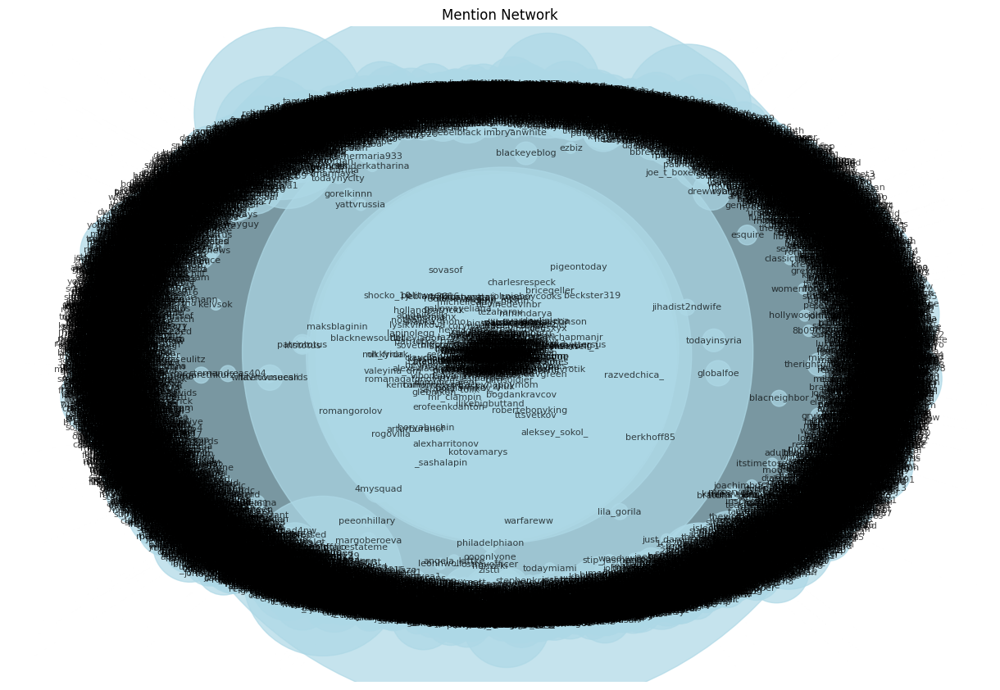

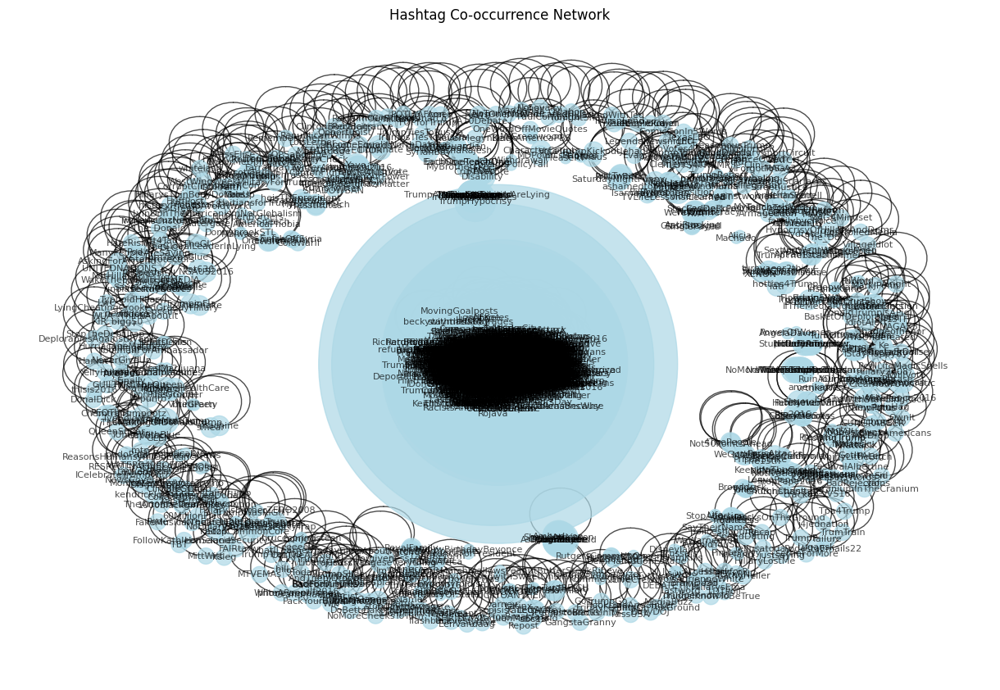

In [6]:
# Plot networks
plot_network(mention_network, "Mention Network")
plot_network(hashtag_network, "Hashtag Co-occurrence Network")

In [7]:
# Calculate network metrics
mention_metrics = generate_network_metrics(mention_network)
hashtag_metrics = generate_network_metrics(hashtag_network)

NetworkXNotImplemented: not implemented for directed type

In [ ]:

# Print results
print("Mention Network Metrics:", mention_metrics)
print("Hashtag Network Metrics:", hashtag_metrics)

In [23]:
def perform_basic_eda(tweets_df, users_df):
    """
    Perform basic exploratory data analysis on the Twitter dataset
    """
    # Convert created_str to datetime
    tweets_df['created_at'] = pd.to_datetime(tweets_df['created_str'])
    
    # 1. Temporal Analysis
    tweets_df['hour'] = tweets_df['created_at'].dt.hour
    tweets_df['day'] = tweets_df['created_at'].dt.day
    tweets_df['month'] = tweets_df['created_at'].dt.month
    tweets_df['year'] = tweets_df['created_at'].dt.year
    
    # Time series plot of tweet activity
    plt.figure(figsize=(15, 5))
    tweets_df['created_at'].value_counts().sort_index().plot()
    plt.title('Tweet Activity Over Time')
    plt.xlabel('Date')
    plt.ylabel('Number of Tweets')
    plt.show()

    # 2. User Activity Analysis
    user_tweet_counts = tweets_df['user_key'].value_counts()
    
    plt.figure(figsize=(10, 5))
    user_tweet_counts.head(20).plot(kind='bar')
    plt.title('Top 20 Most Active Users')
    plt.xlabel('User')
    plt.ylabel('Number of Tweets')
    plt.xticks(rotation=45)
    plt.show()

    # 3. Content Analysis
    # Hashtag frequency
    hashtag_counts = pd.Series([tag for tags in tweets_df['hashtags'] 
                              for tag in tags]).value_counts()
    
    plt.figure(figsize=(12, 6))
    hashtag_counts.head(20).plot(kind='bar')
    plt.title('Top 20 Most Used Hashtags')
    plt.xlabel('Hashtag')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()

    # 4. Basic Statistics
    print("\nBasic Statistics:")
    print(f"Total number of tweets: {len(tweets_df)}")
    print(f"Total number of unique users: {tweets_df['user_key'].nunique()}")
    print(f"Average tweets per user: {len(tweets_df)/tweets_df['user_key'].nunique():.2f}")
    print(f"\nTime span: from {tweets_df['created_at'].min()} to {tweets_df['created_at'].max()}")
    
    return {
        'user_tweet_counts': user_tweet_counts,
        'hashtag_counts': hashtag_counts,
        'temporal_data': tweets_df[['created_at', 'hour', 'day', 'month', 'year']]
    }

def analyze_user_engagement(tweets_df):
    """
    Analyze user engagement patterns
    """
    # Calculate engagement metrics
    tweets_df['has_mentions'] = tweets_df['mentions'].apply(len) > 0
    tweets_df['has_hashtags'] = tweets_df['hashtags'].apply(len) > 0
    
    # Create engagement summary
    engagement_summary = pd.DataFrame({
        'total_tweets': tweets_df.groupby('user_key').size(),
        'tweets_with_mentions': tweets_df.groupby('user_key')['has_mentions'].sum(),
        'tweets_with_hashtags': tweets_df.groupby('user_key')['has_hashtags'].sum(),
        'avg_retweets': tweets_df.groupby('user_key')['retweet_count'].mean(),
        'avg_favorites': tweets_df.groupby('user_key')['favorite_count'].mean()
    })
    
    # Calculate engagement ratios
    engagement_summary['mention_ratio'] = engagement_summary['tweets_with_mentions'] / engagement_summary['total_tweets']
    engagement_summary['hashtag_ratio'] = engagement_summary['tweets_with_hashtags'] / engagement_summary['total_tweets']
    
    return engagement_summary

def analyze_tweet_content(tweets_df):
    """
    Analyze tweet content patterns
    """
    # Analyze tweet lengths
    tweets_df['tweet_length'] = tweets_df['text'].str.len()
    
    plt.figure(figsize=(10, 5))
    sns.histplot(data=tweets_df, x='tweet_length', bins=50)
    plt.title('Distribution of Tweet Lengths')
    plt.xlabel('Tweet Length (characters)')
    plt.ylabel('Count')
    plt.show()
    
    # Analyze hashtag usage patterns
    tweets_df['hashtag_count'] = tweets_df['hashtags'].apply(len)
    
    plt.figure(figsize=(10, 5))
    tweets_df['hashtag_count'].value_counts().sort_index().plot(kind='bar')
    plt.title('Distribution of Hashtags per Tweet')
    plt.xlabel('Number of Hashtags')
    plt.ylabel('Number of Tweets')
    plt.show()
    
    return {
        'avg_tweet_length': tweets_df['tweet_length'].mean(),
        'avg_hashtags_per_tweet': tweets_df['hashtag_count'].mean(),
        'max_hashtags_in_tweet': tweets_df['hashtag_count'].max()
    }


In [24]:
# Load the data first using the previous load_and_clean_data function
tweets_df, users_df = load_and_clean_data('tweets.csv', 'users.csv')

In [30]:
print(tweets_df.head())

        user_id         user_key          created_at          created_str  \
0  2.532612e+09        kathiemrr 2017-02-27 14:54:00  2017-02-27 14:54:00   
1  2.531160e+09   traceyhappymom 2016-08-15 14:50:20  2016-08-15 14:50:20   
2           NaN    evewebster373 2015-06-30 21:56:09  2015-06-30 21:56:09   
3  4.840552e+09      blacktolive 2016-09-16 08:04:48  2016-09-16 08:04:48   
4  1.694026e+09  jacquelinisbest 2016-09-18 19:46:25  2016-09-18 19:46:25   

   retweet_count retweeted  favorite_count  \
0            NaN       NaN             NaN   
1            NaN       NaN             NaN   
2            NaN       NaN             NaN   
3           18.0     False            17.0   
4            0.0     False             0.0   

                                                text      tweet_id  \
0    #ThingsDoneByMistake kissing auntie in the lips  8.362279e+17   
1  RT @mc_derpin: #TheOlderWeGet the more pessimi...  7.651989e+17   
2  RT @dmataconis: Ready To Feel Like A Failure? .

In [31]:
print(users_df.head())

            id                       location              name  \
0  100345056.0  still ⬆️Block⤵️Corner⬇️street  #Ezekiel2517✨...   
1  247165706.0                    Chicago, IL  B E C K S T E R✨   
2  249538861.0                            NaN     Chris Osborne   
3  449689677.0                            NaN    Рамзан Кадыров   
4  471868887.0        Санкт-Петербург, Россия   Маргарита Саваж   

   followers_count  statuses_count                    time_zone verified lang  \
0           1053.0         31858.0                          NaN    False   en   
1            650.0          6742.0  Mountain Time (US & Canada)    False   en   
2             44.0           843.0                          NaN    False   en   
3          94773.0         10877.0                       Moscow    False   ru   
4          23305.0         18401.0                    Volgograd    False   ru   

     screen_name                                        description  \
0    SCOTTGOHARD  CELEBRITY TRAINER ✨#4

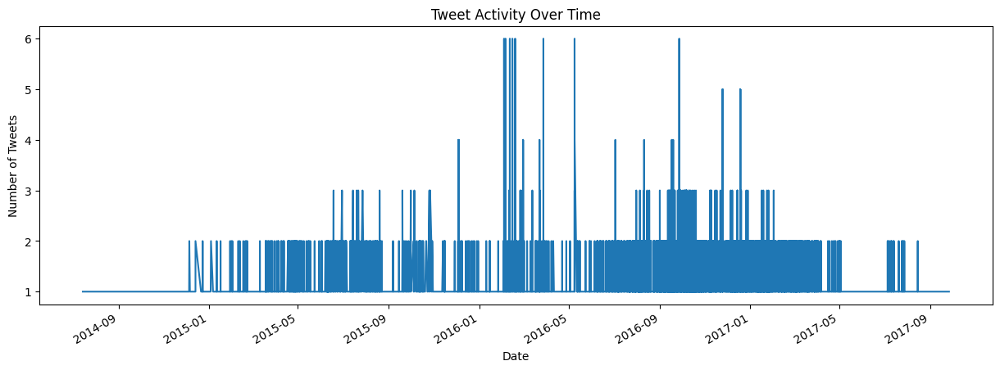

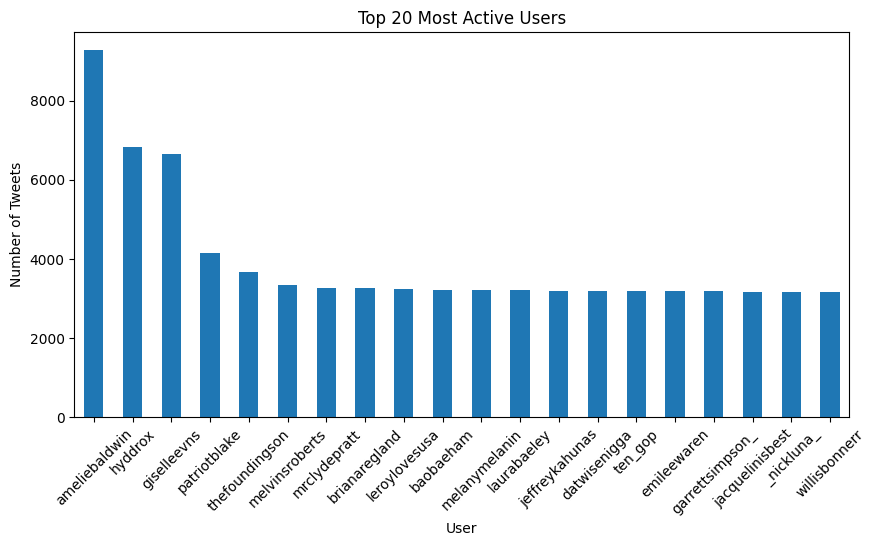

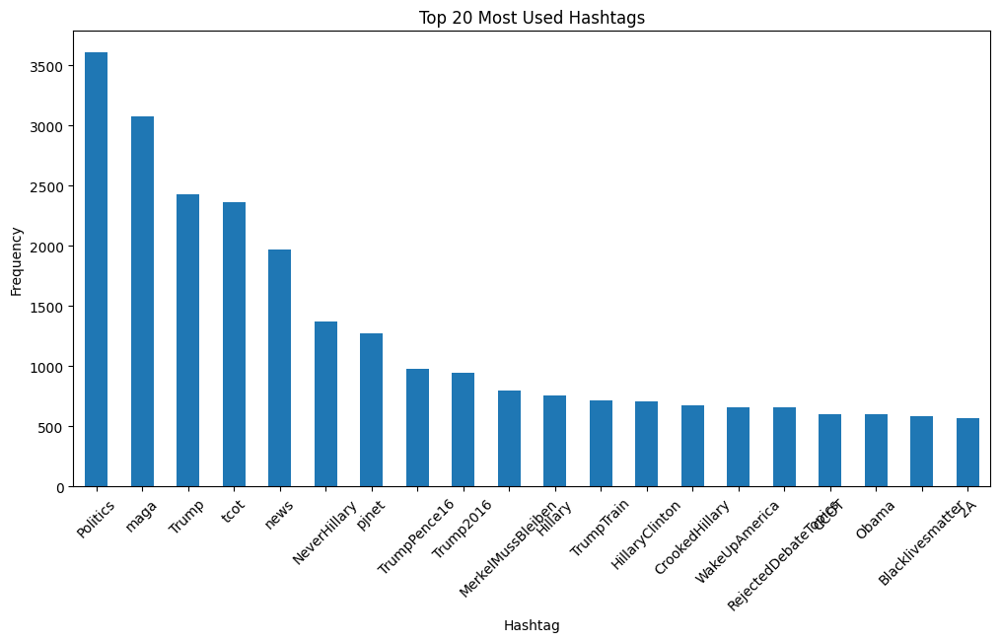


Basic Statistics:
Total number of tweets: 203451
Total number of unique users: 453
Average tweets per user: 449.12

Time span: from 2014-07-14 18:04:55 to 2017-09-26 09:05:32


In [25]:
# Perform basic EDA
eda_results = perform_basic_eda(tweets_df, users_df)

In [26]:
# Analyze user engagement
engagement_summary = analyze_user_engagement(tweets_df)
print("\nTop 10 Most Engaged Users:")
print(engagement_summary.sort_values('total_tweets', ascending=False).head(10))


Top 10 Most Engaged Users:
                total_tweets  tweets_with_mentions  tweets_with_hashtags  \
user_key                                                                   
ameliebaldwin           9269                  6090                  3161   
hyddrox                 6813                  3628                  2011   
giselleevns             6652                   242                  5277   
patriotblake            4140                   983                  1138   
thefoundingson          3663                    73                  1107   
melvinsroberts          3346                    79                  2482   
mrclydepratt            3263                    78                   986   
brianaregland           3261                   258                   463   
leroylovesusa           3229                   404                  1104   
baobaeham               3215                    79                   954   

                avg_retweets  avg_favorites  mention_ratio 

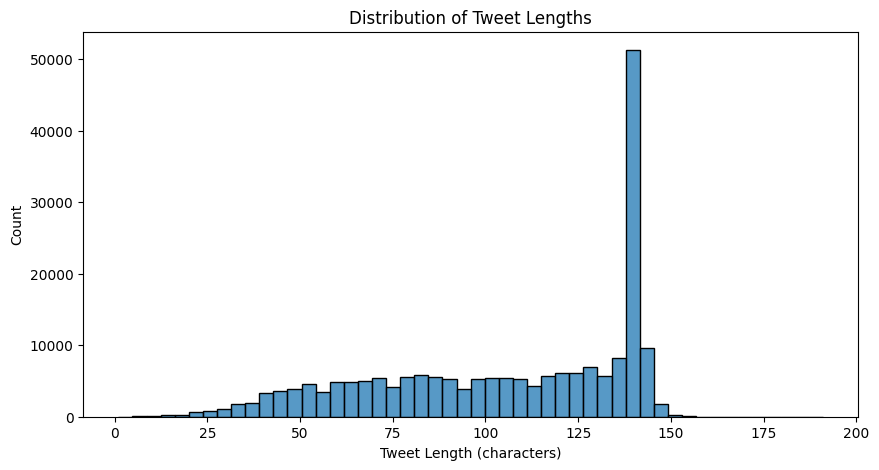

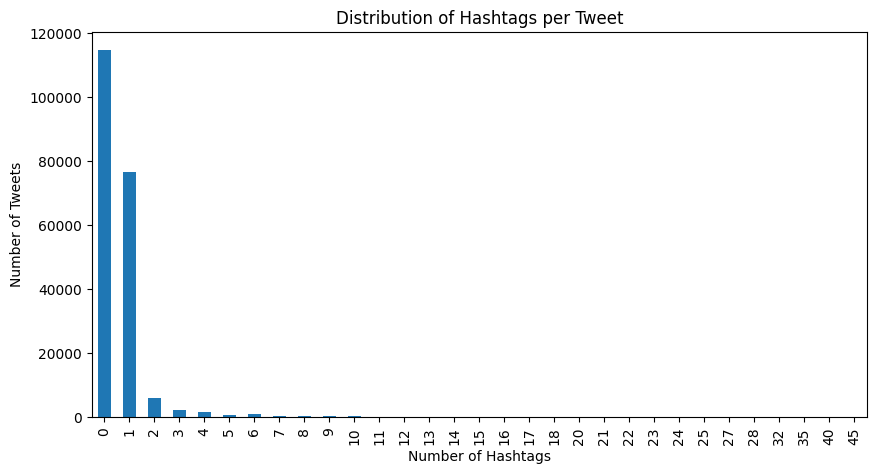


Tweet Content Statistics:
{'avg_tweet_length': np.float64(105.55579806321585), 'avg_hashtags_per_tweet': np.float64(0.5954160952760124), 'max_hashtags_in_tweet': np.int64(45)}


In [27]:
# Analyze tweet content
content_stats = analyze_tweet_content(tweets_df)
print("\nTweet Content Statistics:")
print(content_stats)

In [18]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import ast
from collections import Counter
import numpy as np
import seaborn as sns


def load_and_clean_data(tweets_path, users_path):
    """
    Load and clean the Twitter data from CSV files
    """
    # Load the data
    tweets_df = pd.read_csv(tweets_path)
    users_df = pd.read_csv(users_path)
    
    def safe_eval(x):
        try:
            return ast.literal_eval(x)
        except:
            return []
    
    # Clean the mentions and hashtags columns
    tweets_df['hashtags'] = tweets_df['hashtags'].apply(safe_eval)
    tweets_df['mentions'] = tweets_df['mentions'].apply(safe_eval)
    
    return tweets_df, users_df


def create_mention_network(tweets_df):
    """
    Create a network based on user mentions
    """
    G = nx.DiGraph()
    
    # Add edges for mentions
    for _, tweet in tweets_df.iterrows():
        source = tweet['user_key']
        for mention in tweet['mentions']:
            G.add_edge(source, mention)
    
    return G


def create_hashtag_network(tweets_df):
    """
    Create a network where nodes are hashtags and edges represent co-occurrence
    """
    G = nx.Graph()
    
    # Add edges for hashtag co-occurrences
    for _, tweet in tweets_df.iterrows():
        hashtags = tweet['hashtags']
        for i in range(len(hashtags)):
            for j in range(i + 1, len(hashtags)):
                G.add_edge(hashtags[i], hashtags[j])
    
    return G


def generate_network_metrics(G):
    """
    Calculate various network metrics for both directed and undirected graphs
    """
    metrics = {
        'num_nodes': G.number_of_nodes(),
        'num_edges': G.number_of_edges(),
        'density': nx.density(G),
    }
    
    # Add degree metrics based on graph type
    if G.is_directed():
        metrics.update({
            'avg_in_degree': sum(dict(G.in_degree()).values()) / G.number_of_nodes(),
            'avg_out_degree': sum(dict(G.out_degree()).values()) / G.number_of_nodes()
        })
        
        # For directed graphs, check strongly connected components
        largest_scc = max(nx.strongly_connected_components(G), key=len)
        metrics['largest_scc_size'] = len(largest_scc)
        
        # Get weakly connected components
        largest_wcc = max(nx.weakly_connected_components(G), key=len)
        metrics['largest_wcc_size'] = len(largest_wcc)
        
    else:
        metrics['avg_degree'] = sum(dict(G.degree()).values()) / G.number_of_nodes()
        
        # For undirected graphs, check connected components
        largest_cc = max(nx.connected_components(G), key=len)
        metrics['largest_cc_size'] = len(largest_cc)
        
        # Calculate clustering coefficient for undirected graphs
        metrics['avg_clustering'] = nx.average_clustering(G)
    
    # Calculate degree centrality
    degree_centrality = nx.degree_centrality(G)
    metrics['max_degree_centrality'] = max(degree_centrality.values())
    
    # Add basic network statistics carefully
    try:
        # Try to estimate diameter for the largest component
        if G.is_directed():
            largest_wcc = max(nx.weakly_connected_components(G), key=len)
            subgraph = G.subgraph(largest_wcc)
            metrics['largest_wcc_diameter'] = nx.approximation.diameter(subgraph)
        else:
            largest_cc = max(nx.connected_components(G), key=len)
            subgraph = G.subgraph(largest_cc)
            metrics['largest_cc_diameter'] = nx.approximation.diameter(subgraph)
    except Exception as e:
        metrics['diameter_calculation_error'] = str(e)
    
    return metrics


def analyze_components(G):
    """
    Analyze the connected components of the network
    """
    results = {}
    
    if G.is_directed():
        # For directed graphs
        weakly_connected = list(nx.weakly_connected_components(G))
        strongly_connected = list(nx.strongly_connected_components(G))
        
        results['num_weakly_connected'] = len(weakly_connected)
        results['num_strongly_connected'] = len(strongly_connected)
        results['largest_wcc_size'] = len(max(weakly_connected, key=len))
        results['largest_scc_size'] = len(max(strongly_connected, key=len))
    else:
        # For undirected graphs
        connected = list(nx.connected_components(G))
        results['num_connected'] = len(connected)
        results['largest_cc_size'] = len(max(connected, key=len))
    
    return results


def analyze_network_scales(G):
    """
    Analyze network at different scales (micro to macro)
    """
    results = {}
    
    # Micro-scale: Node-level statistics
    degrees = [d for n, d in G.degree()]
    results['degree_stats'] = {
        'min': min(degrees),
        'max': max(degrees),
        'mean': np.mean(degrees),
        'median': np.median(degrees),
        'std': np.std(degrees)
    }
    
    # Meso-scale: Community and component analysis
    if G.is_directed():
        wcc = list(nx.weakly_connected_components(G))
        scc = list(nx.strongly_connected_components(G))
        results['component_stats'] = {
            'num_weakly_connected': len(wcc),
            'largest_wcc_size': len(max(wcc, key=len)),
            'num_strongly_connected': len(scc),
            'largest_scc_size': len(max(scc, key=len))
        }
    else:
        cc = list(nx.connected_components(G))
        results['component_stats'] = {
            'num_components': len(cc),
            'largest_component_size': len(max(cc, key=len))
        }
    
    # Macro-scale: Global network properties
    results['global_stats'] = {
        'density': nx.density(G),
        'reciprocity': nx.reciprocity(G) if G.is_directed() else 'undirected'
    }
    
    # Try to calculate average clustering coefficient
    try:
        results['global_stats']['avg_clustering'] = nx.average_clustering(G)
    except:
        results['global_stats']['avg_clustering'] = None
    
    return results


def analyze_network_structure(G, top_n=10):
    """
    Analyze the structure of the network in more detail
    """
    results = {}
    
    # Identify most central nodes using different centrality measures
    if G.is_directed():
        # For directed graphs
        results['in_degree_central'] = sorted(
            nx.in_degree_centrality(G).items(), 
            key=lambda x: x[1],
            reverse=True
        )[:top_n]
        
        results['out_degree_central'] = sorted(
            nx.out_degree_centrality(G).items(), 
            key=lambda x: x[1],
            reverse=True
        )[:top_n]
        
        results['pagerank'] = sorted(
            nx.pagerank(G).items(), 
            key=lambda x: x[1],
            reverse=True
        )[:top_n]
    else:
        # For undirected graphs
        results['degree_central'] = sorted(
            nx.degree_centrality(G).items(), 
            key=lambda x: x[1],
            reverse=True
        )[:top_n]
        
        results['betweenness_central'] = sorted(
            nx.betweenness_centrality(G).items(), 
            key=lambda x: x[1],
            reverse=True
        )[:top_n]
        
        # Calculate eigenvector centrality only for the largest connected component
        largest_cc = max(nx.connected_components(G), key=len)
        largest_subgraph = G.subgraph(largest_cc)
        
        try:
            eig_centrality = nx.eigenvector_centrality_numpy(largest_subgraph)
            # Add zeros for nodes not in largest component
            full_eig_centrality = {node: (eig_centrality[node] if node in largest_cc else 0) 
                                 for node in G.nodes()}
            
            results['eigenvector_central'] = sorted(
                full_eig_centrality.items(),
                key=lambda x: x[1],
                reverse=True
            )[:top_n]
        except Exception as e:
            results['eigenvector_central_error'] = str(e)
            # Use closeness centrality as an alternative
            results['closeness_central'] = sorted(
                nx.closeness_centrality(G).items(),
                key=lambda x: x[1],
                reverse=True
            )[:top_n]
    
    # Analyze degree distribution
    degrees = [d for n, d in G.degree()]
    results['degree_dist'] = {
        'mean': np.mean(degrees),
        'median': np.median(degrees),
        'max': max(degrees),
        'min': min(degrees)
    }
    
    return results


def plot_network(G, title='Network Visualization', figsize=(12, 8)):
    """
    Plot the network using networkx with improved layout and visualization
    """
    plt.figure(figsize=figsize)
    
    # Use spring layout with adjusted parameters
    pos = nx.spring_layout(
        G,
        k=1/np.sqrt(G.number_of_nodes()),  # Optimal distance between nodes
        iterations=20  # More iterations for better layout
    )
    
    # Calculate node sizes based on degree centrality
    node_sizes = [
        (G.degree(node) + 1) * 100 for node in G.nodes()
    ]
    
    # Draw the network
    nx.draw(
        G,
        pos,
        node_color='lightblue',
        node_size=node_sizes,
        with_labels=True,
        font_size=8,
        alpha=0.7,
        edge_color='gray',
        width=0.5
    )
    
    plt.title(title)
    plt.show()

In [19]:
# Load data
tweets_df, users_df = load_and_clean_data('tweets.csv', 'users.csv')

In [20]:
# Create networks
mention_network = create_mention_network(tweets_df)
hashtag_network = create_hashtag_network(tweets_df)

In [21]:
# Calculate metrics
mention_structure = analyze_network_structure(mention_network)
hashtag_structure = analyze_network_structure(hashtag_network)

In [22]:
# Print results
print("Mention Network Metrics:")
for k, v in mention_metrics.items():
    print(f"{k}: {v}")

print("\nTop users by PageRank:")
for user, score in mention_structure['pagerank']:
    print(f"{user}: {score:.4f}")


Mention Network Metrics:
num_nodes: 14153
num_edges: 33180
density: 0.00016565710030696192
avg_in_degree: 2.344379283544125
avg_out_degree: 2.344379283544125
largest_scc_size: 12
largest_wcc_size: 14128
max_degree_centrality: 0.28158564160542676
diameter_calculation_error: DiGraph not strongly connected.

Top users by PageRank:
realdonaldtrump: 0.0012
romaacorn: 0.0007
hillaryclinton: 0.0007
tina_kandelaki: 0.0004
rt_america: 0.0004
potus: 0.0003
rt_com: 0.0003
wikileaks: 0.0003
tagesschau: 0.0002
yasyueksel: 0.0002


In [32]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import Counter

def create_and_plot_mention_network(tweets_df, min_weight=2):
    """
    Create and visualize the mention network
    Only show edges with weight >= min_weight
    """
    # Create directed graph
    G = nx.DiGraph()
    
    # Count mentions between users
    mention_weights = {}
    for _, tweet in tweets_df.iterrows():
        source = tweet['user_key']
        mentions = tweet['mentions']
        for target in mentions:
            key = (source, target)
            mention_weights[key] = mention_weights.get(key, 0) + 1
    
    # Add edges with weights above threshold
    for (source, target), weight in mention_weights.items():
        if weight >= min_weight:
            G.add_edge(source, target, weight=weight)
    
    # Plot
    plt.figure(figsize=(15, 10))
    
    # Use spring layout with adjusted parameters
    pos = nx.spring_layout(G, k=2/np.sqrt(G.number_of_nodes()))
    
    # Draw edges with varying width based on weight
    edge_widths = [G[u][v]['weight']/2 for u, v in G.edges()]
    
    nx.draw(G, pos,
            node_color='lightblue',
            node_size=1000,
            width=edge_widths,
            with_labels=True,
            font_size=8,
            edge_color='gray',
            alpha=0.7)
    
    plt.title('User Mention Network\n(edges represent mentions ≥ {} times)'.format(min_weight))
    plt.show()

def create_and_plot_hashtag_network(tweets_df, min_cooccurrence=2):
    """
    Create and visualize hashtag co-occurrence network
    Only show edges with co-occurrence >= min_cooccurrence
    """
    # Create undirected graph
    G = nx.Graph()
    
    # Count hashtag co-occurrences
    cooccurrences = {}
    for _, tweet in tweets_df.iterrows():
        hashtags = tweet['hashtags']
        for i in range(len(hashtags)):
            for j in range(i + 1, len(hashtags)):
                key = tuple(sorted([hashtags[i], hashtags[j]]))
                cooccurrences[key] = cooccurrences.get(key, 0) + 1
    
    # Add edges with weights above threshold
    for (tag1, tag2), weight in cooccurrences.items():
        if weight >= min_cooccurrence:
            G.add_edge(tag1, tag2, weight=weight)
    
    # Plot
    plt.figure(figsize=(15, 10))
    
    # Use spring layout
    pos = nx.spring_layout(G, k=2/np.sqrt(G.number_of_nodes()))
    
    # Draw edges with varying width based on weight
    edge_widths = [G[u][v]['weight']/2 for u, v in G.edges()]
    
    nx.draw(G, pos,
            node_color='lightgreen',
            node_size=1000,
            width=edge_widths,
            with_labels=True,
            font_size=8,
            edge_color='gray',
            alpha=0.7)
    
    plt.title('Hashtag Co-occurrence Network\n(edges represent co-occurrence ≥ {} times)'.format(min_cooccurrence))
    plt.show()

def create_and_plot_interaction_network(tweets_df, min_interactions=2):
    """
    Create and visualize user interaction network (retweets and replies)
    Only show edges with interactions >= min_interactions
    """
    # Create directed graph
    G = nx.DiGraph()
    
    # Count interactions
    interactions = {}
    
    # Add retweets
    retweets_mask = tweets_df['retweeted_status_id'].notna()
    retweet_pairs = tweets_df[retweets_mask][['user_key', 'retweeted_status_id']]
    
    for _, pair in retweet_pairs.iterrows():
        key = (pair['user_key'], pair['retweeted_status_id'])
        interactions[key] = interactions.get(key, 0) + 1
    
    # Add replies
    replies_mask = tweets_df['in_reply_to_status_id'].notna()
    reply_pairs = tweets_df[replies_mask][['user_key', 'in_reply_to_status_id']]
    
    for _, pair in reply_pairs.iterrows():
        key = (pair['user_key'], pair['in_reply_to_status_id'])
        interactions[key] = interactions.get(key, 0) + 1
    
    # Add edges with weights above threshold
    for (source, target), weight in interactions.items():
        if weight >= min_interactions:
            G.add_edge(source, target, weight=weight)
    
    # Plot
    plt.figure(figsize=(15, 10))
    
    # Use spring layout
    pos = nx.spring_layout(G, k=2/np.sqrt(G.number_of_nodes()))
    
    # Draw edges with varying width based on weight
    edge_widths = [G[u][v]['weight']/2 for u, v in G.edges()]
    
    nx.draw(G, pos,
            node_color='lightyellow',
            node_size=1000,
            width=edge_widths,
            with_labels=True,
            font_size=8,
            edge_color='gray',
            alpha=0.7)
    
    plt.title('User Interaction Network\n(edges represent interactions ≥ {} times)'.format(min_interactions))
    plt.show()


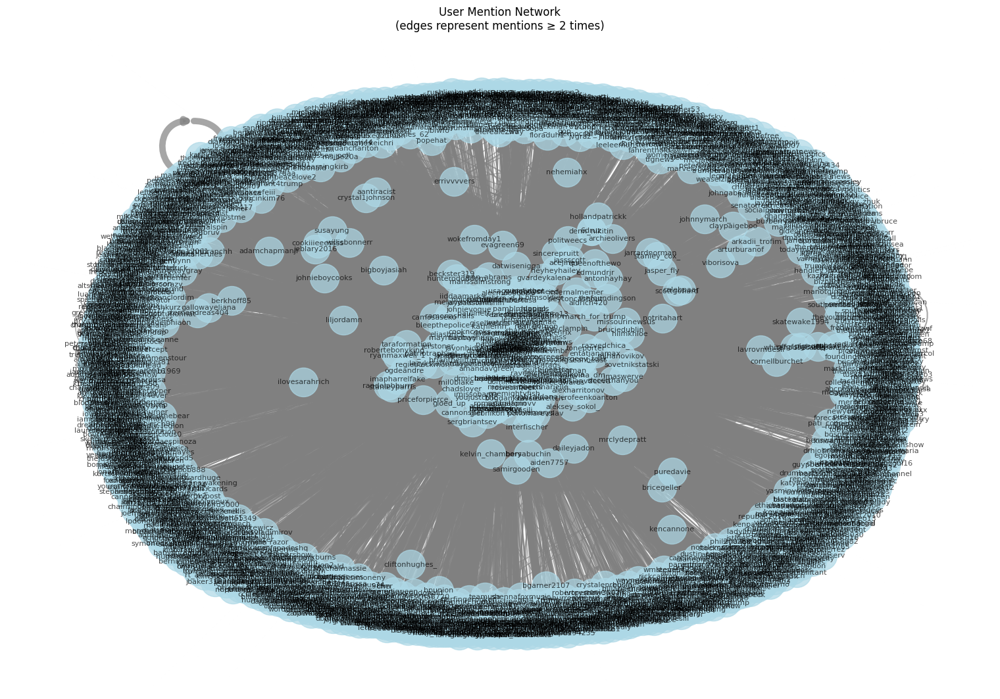

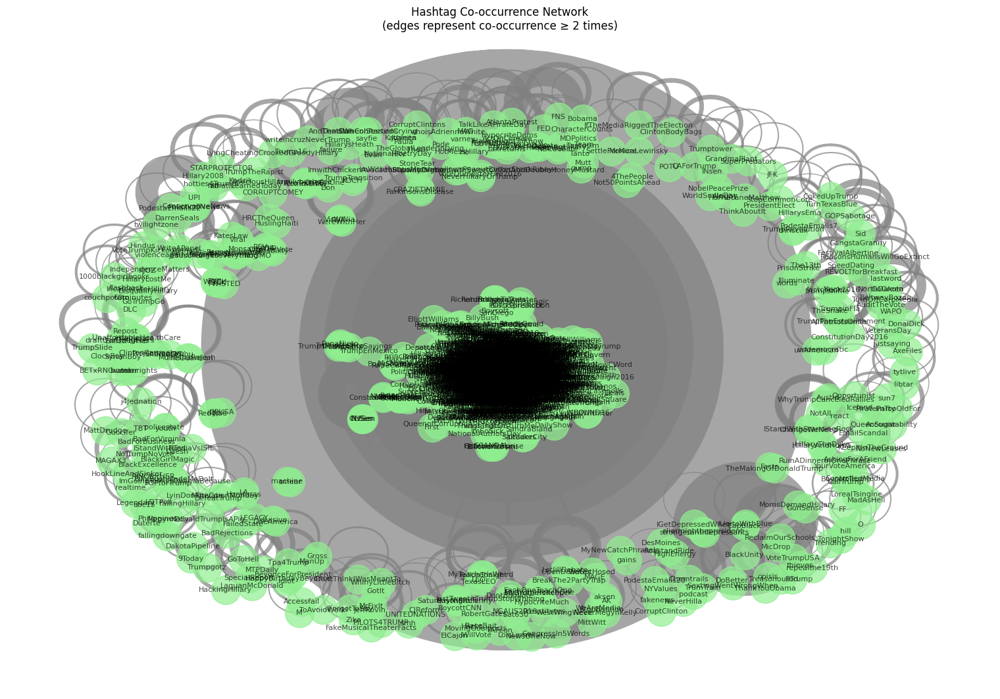

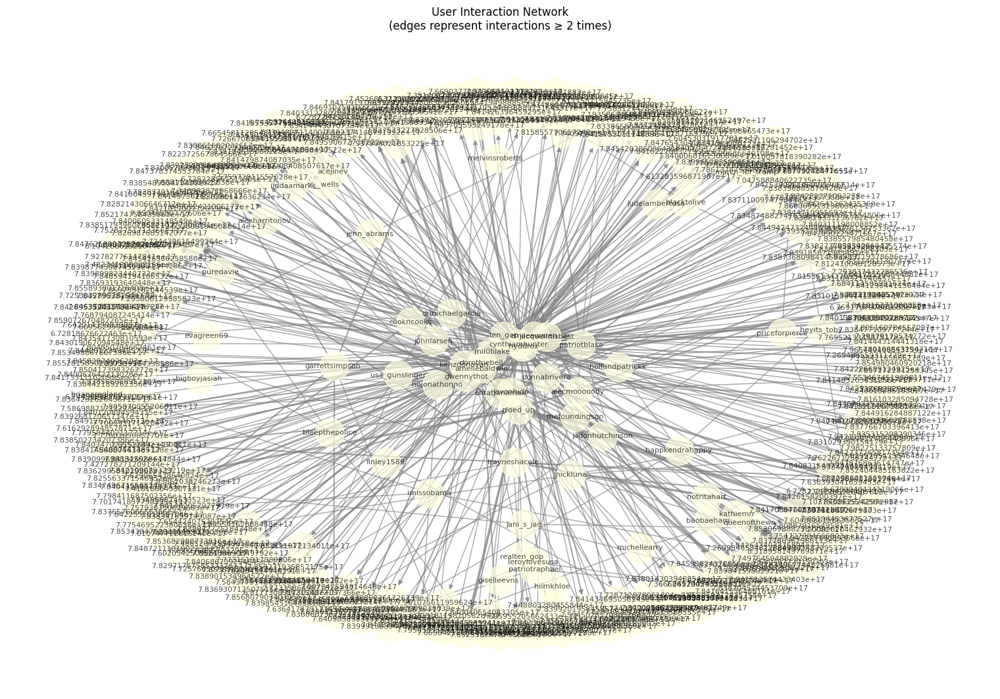

In [33]:


# Create networks with minimum thresholds to reduce noise
create_and_plot_mention_network(tweets_df, min_weight=2)
create_and_plot_hashtag_network(tweets_df, min_cooccurrence=2)
create_and_plot_interaction_network(tweets_df, min_interactions=2)


In [40]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def analyze_mentions_over_time(tweets_df, period='Q', min_mentions=3):
    """
    Analyze user mentions split by time periods.
    
    Parameters:
    - tweets_df: DataFrame with tweet data
    - period: Time period for splitting ('Y'=yearly, 'Q'=quarterly, 'M'=monthly)
    - min_mentions: Minimum number of mentions to include an edge
    """
    # Convert to datetime
    tweets_df['created_at'] = pd.to_datetime(tweets_df['created_str'])
    
    # Add period column
    tweets_df['period'] = tweets_df['created_at'].dt.to_period(period)
    
    # Group by period
    periods = sorted(tweets_df['period'].unique())
    
    for current_period in periods:
        # Filter data for current period
        period_df = tweets_df[tweets_df['period'] == current_period]
        
        # Create mention graph for this period
        G = nx.DiGraph()
        
        # Count mentions between users
        mention_counts = {}
        for _, row in period_df.iterrows():
            source = row['user_key']
            for target in row['mentions']:
                if source != target:  # Avoid self-loops
                    key = (source, target)
                    mention_counts[key] = mention_counts.get(key, 0) + 1
        
        # Add edges with weight >= min_mentions
        for (source, target), weight in mention_counts.items():
            if weight >= min_mentions:
                G.add_edge(source, target, weight=weight)
        
        # Only plot if we have enough nodes
        if G.number_of_nodes() >= 3:
            plot_period_network(G, current_period)
            print_network_stats(G, current_period)

def plot_period_network(G, period):
    """
    Plot network for a specific time period with node size based on degree
    and color intensity based on in-degree.
    """
    # Create figure with proper sizing for colorbar
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Calculate node properties
    in_degrees = dict(G.in_degree())
    total_degrees = dict(G.degree())
    
    # Node sizes based on total connections
    node_sizes = [
        (total_degrees[node] + 1) * 100 
        for node in G.nodes()
    ]
    
    # Node colors based on times being mentioned (in-degree)
    node_colors = [
        in_degrees[node] 
        for node in G.nodes()
    ]
    
    # Position nodes
    pos = nx.spring_layout(
        G,
        k=1/np.sqrt(G.number_of_nodes()),
        iterations=50
    )
    
    # Draw the network
    nodes = nx.draw_networkx_nodes(
        G,
        pos=pos,
        node_size=node_sizes,
        node_color=node_colors,
        cmap=plt.cm.Blues,
        ax=ax
    )
    
    # Draw edges
    nx.draw_networkx_edges(
        G,
        pos=pos,
        edge_color='gray',
        width=[G[u][v]['weight']/2 for u,v in G.edges()],
        alpha=0.7,
        ax=ax
    )
    
    # Draw labels
    nx.draw_networkx_labels(
        G,
        pos=pos,
        font_size=8,
        font_weight='bold',
        ax=ax
    )
    
    # Add colorbar
    plt.colorbar(nodes, ax=ax, label='Number of mentions received')
    
    plt.title(f'Mention Network - Period: {period}')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def print_network_stats(G, period):
    """
    Print basic statistics about the network.
    """
    print(f"\nNetwork Statistics for {period}")
    print("-" * 40)
    print(f"Number of users: {G.number_of_nodes()}")
    print(f"Number of connections: {G.number_of_edges()}")
    
    # Most active users (mentioning others)
    out_degrees = dict(G.out_degree())
    top_mentioners = sorted(
        out_degrees.items(),
        key=lambda x: x[1],
        reverse=True
    )[:5]
    
    # Most mentioned users
    in_degrees = dict(G.in_degree())
    top_mentioned = sorted(
        in_degrees.items(),
        key=lambda x: x[1],
        reverse=True
    )[:5]
    
    print("\nTop 5 Users Mentioning Others:")
    for user, count in top_mentioners:
        print(f"{user}: {count} mentions made")
        
    print("\nTop 5 Most Mentioned Users:")
    for user, count in top_mentioned:
        print(f"{user}: {count} mentions received")
    
    print("-" * 40 + "\n")

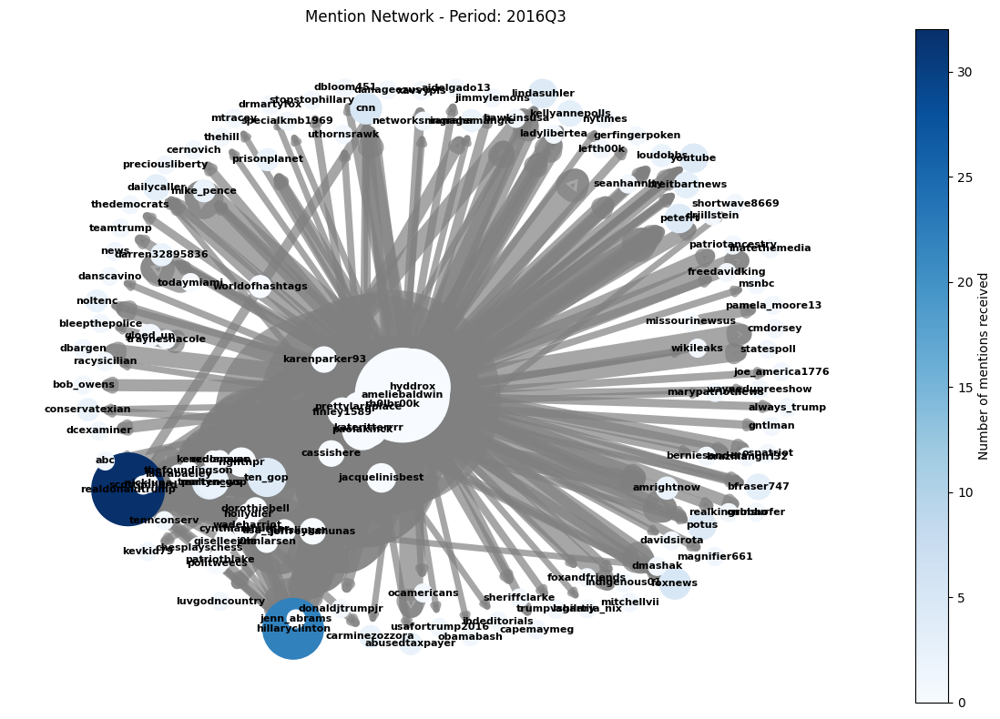


Network Statistics for 2016Q3
----------------------------------------
Number of users: 127
Number of connections: 190

Top 5 Users Mentioning Others:
ameliebaldwin: 54 mentions made
hyddrox: 35 mentions made
rh0lbr00k: 16 mentions made
paolakinck: 9 mentions made
kateritterrrr: 8 mentions made

Top 5 Most Mentioned Users:
realdonaldtrump: 32 mentions received
hillaryclinton: 22 mentions received
cnn: 5 mentions received
foxnews: 5 mentions received
youtube: 4 mentions received
----------------------------------------



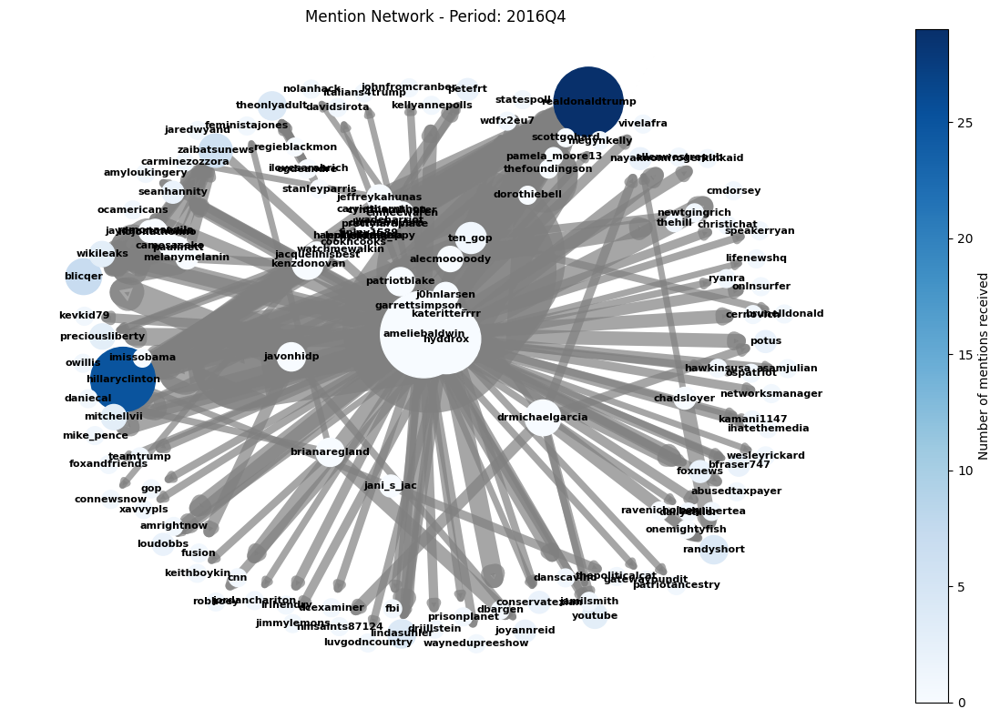


Network Statistics for 2016Q4
----------------------------------------
Number of users: 132
Number of connections: 176

Top 5 Users Mentioning Others:
ameliebaldwin: 46 mentions made
hyddrox: 29 mentions made
drmichaelgarcia: 7 mentions made
kenzdonovan: 5 mentions made
brianaregland: 4 mentions made

Top 5 Most Mentioned Users:
realdonaldtrump: 29 mentions received
hillaryclinton: 25 mentions received
blicqer: 7 mentions received
zaibatsunews: 6 mentions received
theonlyadult: 4 mentions received
----------------------------------------



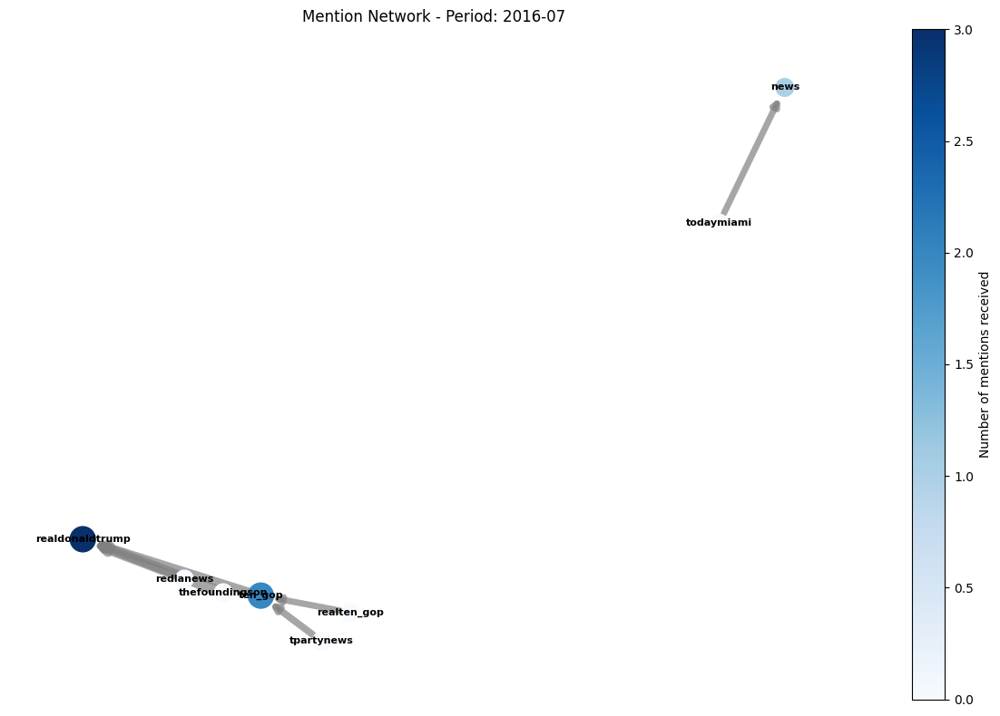


Network Statistics for 2016-07
----------------------------------------
Number of users: 8
Number of connections: 6

Top 5 Users Mentioning Others:
redlanews: 1 mentions made
tpartynews: 1 mentions made
ten_gop: 1 mentions made
thefoundingson: 1 mentions made
realten_gop: 1 mentions made

Top 5 Most Mentioned Users:
realdonaldtrump: 3 mentions received
ten_gop: 2 mentions received
news: 1 mentions received
redlanews: 0 mentions received
tpartynews: 0 mentions received
----------------------------------------



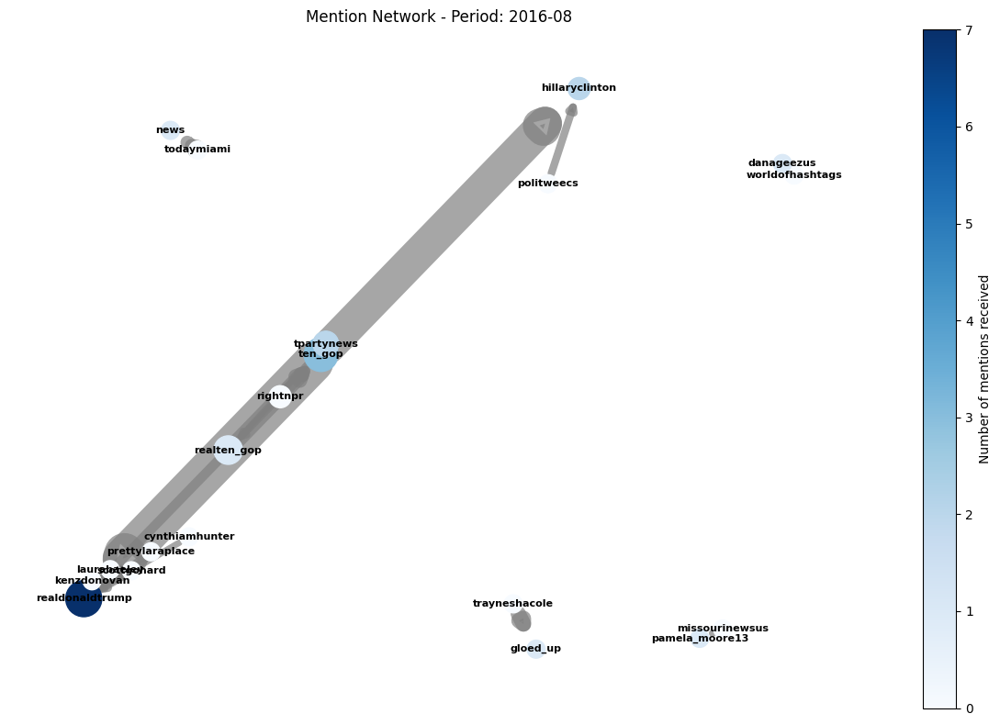


Network Statistics for 2016-08
----------------------------------------
Number of users: 20
Number of connections: 19

Top 5 Users Mentioning Others:
ten_gop: 3 mentions made
realten_gop: 3 mentions made
rightnpr: 2 mentions made
missourinewsus: 1 mentions made
politweecs: 1 mentions made

Top 5 Most Mentioned Users:
realdonaldtrump: 7 mentions received
ten_gop: 3 mentions received
hillaryclinton: 2 mentions received
tpartynews: 2 mentions received
pamela_moore13: 1 mentions received
----------------------------------------



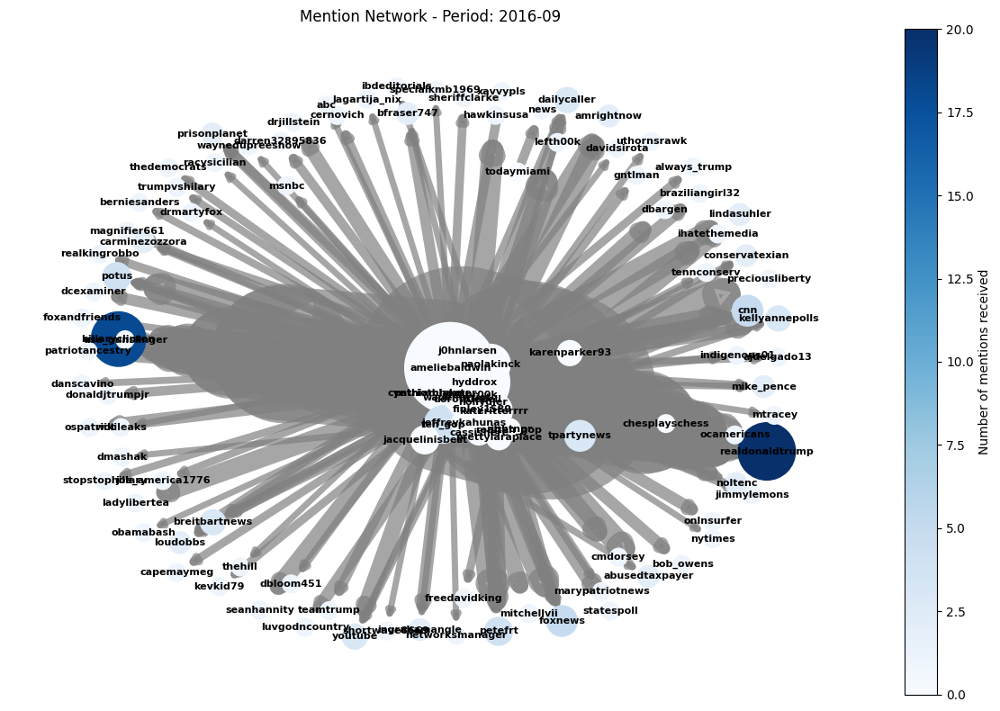


Network Statistics for 2016-09
----------------------------------------
Number of users: 109
Number of connections: 161

Top 5 Users Mentioning Others:
ameliebaldwin: 52 mentions made
hyddrox: 32 mentions made
rh0lbr00k: 15 mentions made
paolakinck: 9 mentions made
kateritterrrr: 8 mentions made

Top 5 Most Mentioned Users:
realdonaldtrump: 20 mentions received
hillaryclinton: 18 mentions received
cnn: 5 mentions received
foxnews: 5 mentions received
ten_gop: 4 mentions received
----------------------------------------



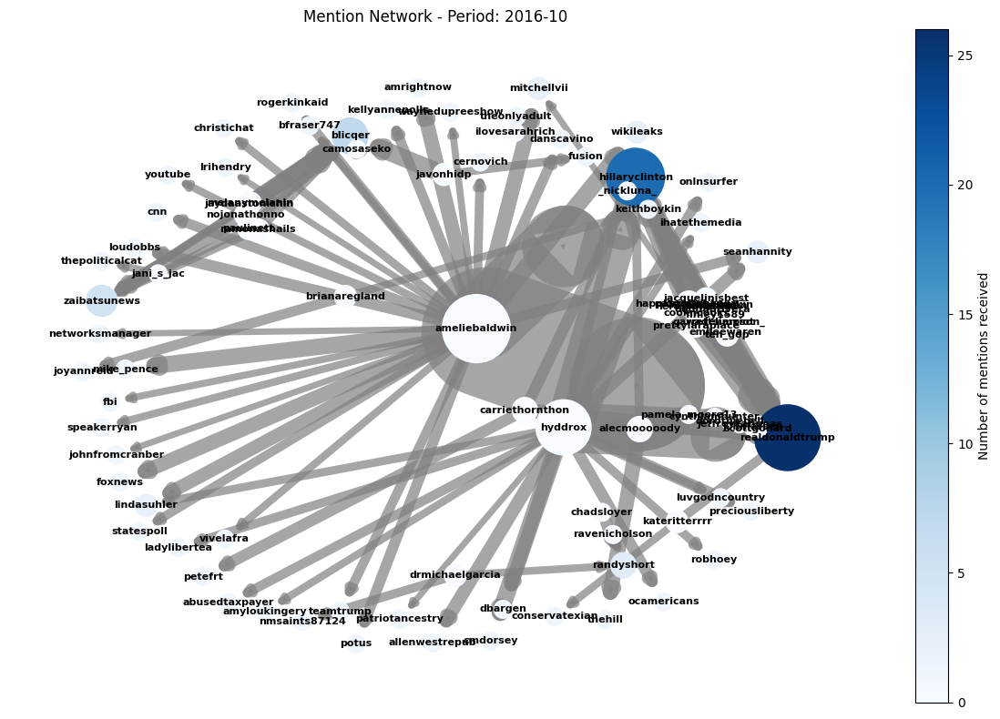


Network Statistics for 2016-10
----------------------------------------
Number of users: 93
Number of connections: 113

Top 5 Users Mentioning Others:
ameliebaldwin: 28 mentions made
hyddrox: 18 mentions made
carriethornthon: 3 mentions made
patriotblake: 3 mentions made
alecmooooody: 3 mentions made

Top 5 Most Mentioned Users:
realdonaldtrump: 26 mentions received
hillaryclinton: 20 mentions received
blicqer: 7 mentions received
zaibatsunews: 5 mentions received
randyshort: 3 mentions received
----------------------------------------



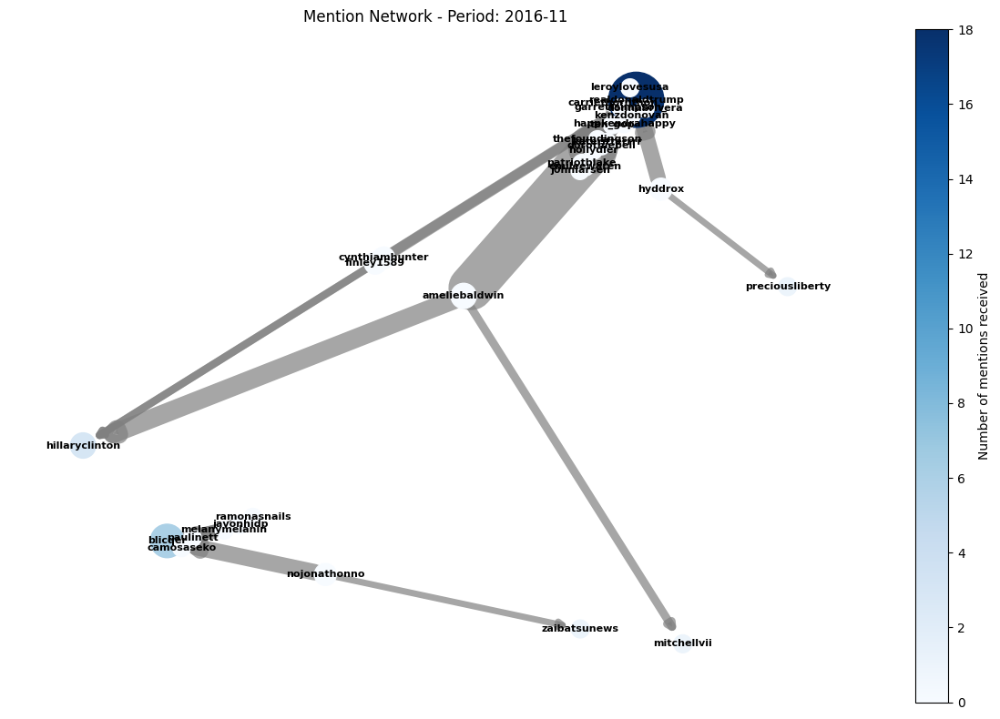


Network Statistics for 2016-11
----------------------------------------
Number of users: 30
Number of connections: 30

Top 5 Users Mentioning Others:
ameliebaldwin: 3 mentions made
cynthiamhunter: 2 mentions made
hyddrox: 2 mentions made
nojonathonno: 2 mentions made
finley1589: 2 mentions made

Top 5 Most Mentioned Users:
realdonaldtrump: 18 mentions received
blicqer: 6 mentions received
hillaryclinton: 3 mentions received
zaibatsunews: 1 mentions received
preciousliberty: 1 mentions received
----------------------------------------



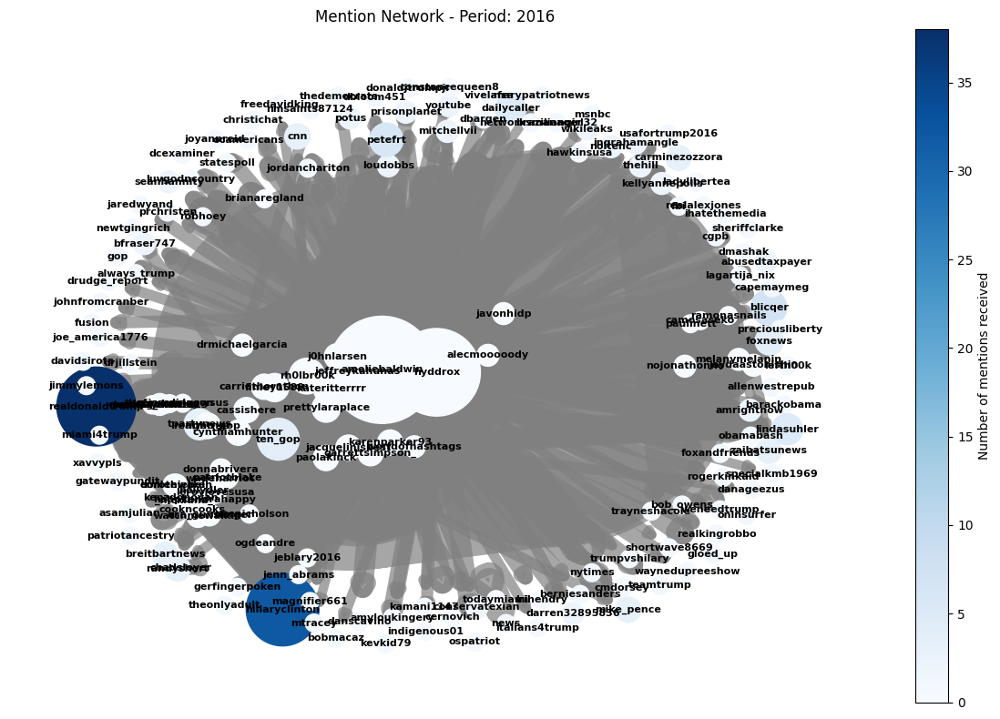


Network Statistics for 2016
----------------------------------------
Number of users: 169
Number of connections: 239

Top 5 Users Mentioning Others:
ameliebaldwin: 71 mentions made
hyddrox: 47 mentions made
rh0lbr00k: 7 mentions made
kateritterrrr: 7 mentions made
ten_gop: 6 mentions made

Top 5 Most Mentioned Users:
realdonaldtrump: 38 mentions received
hillaryclinton: 32 mentions received
blicqer: 7 mentions received
petefrt: 6 mentions received
dailycaller: 5 mentions received
----------------------------------------



In [42]:
# Example usage:

# For quarterly analysis
analyze_mentions_over_time(tweets_df, period='Q', min_mentions=10)

# For monthly analysis
analyze_mentions_over_time(tweets_df, period='M', min_mentions=10)

# For yearly overview
analyze_mentions_over_time(tweets_df, period='Y', min_mentions=15)


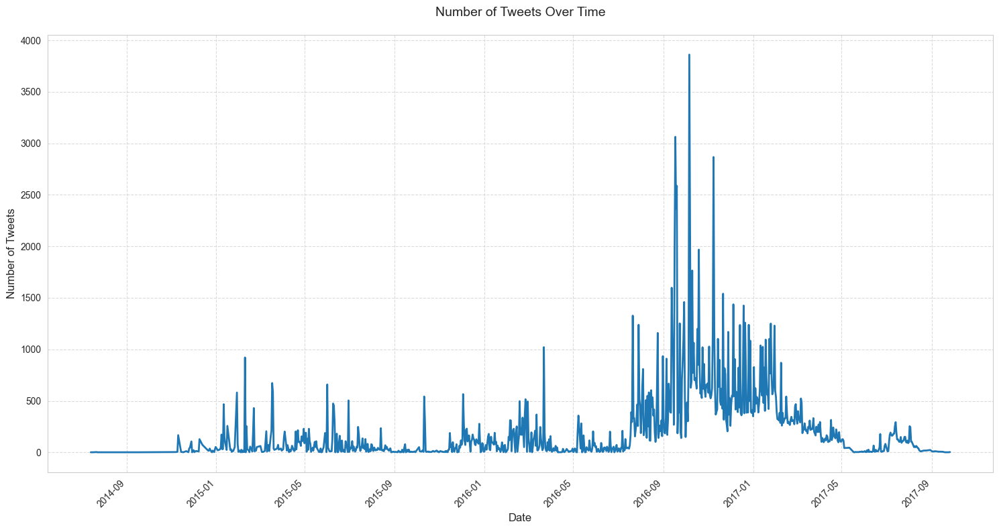


Summary Statistics:
count     930.000000
mean      218.741935
std       361.738132
min         1.000000
25%        15.000000
50%        82.000000
75%       276.000000
max      3861.000000
Name: count, dtype: float64


In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you've already loaded your CSV into tweets_df
# If not, you can load it with:
# tweets_df = pd.read_csv('tweets.csv')

# Convert created_at to datetime if it's not already
tweets_df['created_at'] = pd.to_datetime(tweets_df['created_at'])

# Group by date and count tweets
daily_tweets = tweets_df.groupby(tweets_df['created_at'].dt.date).size().reset_index()
daily_tweets.columns = ['date', 'count']

# Sort by date
daily_tweets = daily_tweets.sort_values('date')

# Create the plot
plt.figure(figsize=(15, 8))
sns.set_style("whitegrid")

# Plot the line
plt.plot(daily_tweets['date'], daily_tweets['count'], linewidth=2)

# Customize the plot
plt.title('Number of Tweets Over Time', fontsize=14, pad=20)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Tweets', fontsize=12)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add grid
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show the plot
plt.show()

# If you want to see the actual numbers:
print("\nSummary Statistics:")
print(daily_tweets['count'].describe())

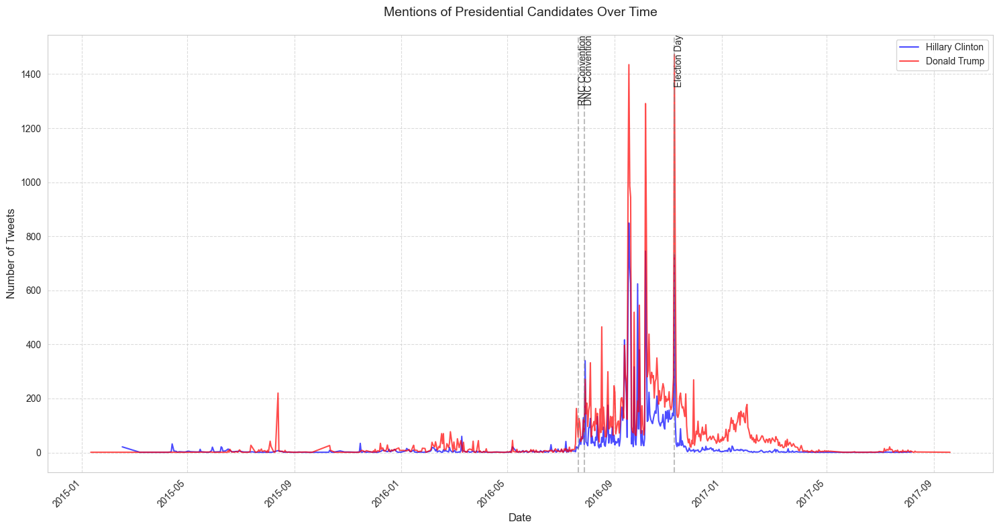


Summary Statistics:

Hillary Clinton mentions:
count    503.000000
mean      35.298211
std       95.053154
min        1.000000
25%        2.000000
50%        6.000000
75%       21.500000
max      849.000000
dtype: float64

Donald Trump mentions:
count     584.000000
mean       68.470890
std       146.986642
min         1.000000
25%         4.000000
50%        17.500000
75%        71.250000
max      1472.000000
dtype: float64

Total Hillary Clinton mentions: 17,755
Total Donald Trump mentions: 39,987


In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming tweets_df is already loaded
# Convert created_at to datetime if not already
tweets_df['created_at'] = pd.to_datetime(tweets_df['created_at'])

# Create boolean masks for mentions of each candidate (case-insensitive)
hillary_mask = tweets_df['text'].str.contains('hillary|hillaryclinton', case=False, na=False)
trump_mask = tweets_df['text'].str.contains('trump|realdonaldtrump', case=False, na=False)

# Create separate dataframes for each candidate's mentions
hillary_tweets = tweets_df[hillary_mask].groupby(tweets_df[hillary_mask]['created_at'].dt.date).size()
trump_tweets = tweets_df[trump_mask].groupby(tweets_df[trump_mask]['created_at'].dt.date).size()

# Create the plot
plt.figure(figsize=(15, 8))
sns.set_style("whitegrid")

# Plot both lines
plt.plot(hillary_tweets.index, hillary_tweets.values, label='Hillary Clinton', color='blue', alpha=0.7)
plt.plot(trump_tweets.index, trump_tweets.values, label='Donald Trump', color='red', alpha=0.7)

# Customize the plot
plt.title('Mentions of Presidential Candidates Over Time', fontsize=14, pad=20)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Tweets', fontsize=12)

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

# Add key dates
key_dates = {
    '2016-07-28': 'DNC Convention',
    '2016-07-21': 'RNC Convention',
    '2016-11-08': 'Election Day'
}

for date, event in key_dates.items():
    plt.axvline(x=pd.to_datetime(date), color='gray', linestyle='--', alpha=0.5)
    plt.text(pd.to_datetime(date), plt.ylim()[1], event, rotation=90, va='top')

# Add legend
plt.legend()

# Add grid
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Print some statistics
print("\nSummary Statistics:")
print("\nHillary Clinton mentions:")
print(hillary_tweets.describe())
print("\nDonald Trump mentions:")
print(trump_tweets.describe())

# Print total mentions
print(f"\nTotal Hillary Clinton mentions: {hillary_tweets.sum():,}")
print(f"Total Donald Trump mentions: {trump_tweets.sum():,}")

/var/folders/9x/h2cdc6094jzcrs4ch0f4r84c0000gn/T/ipykernel_5811/1117616168.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


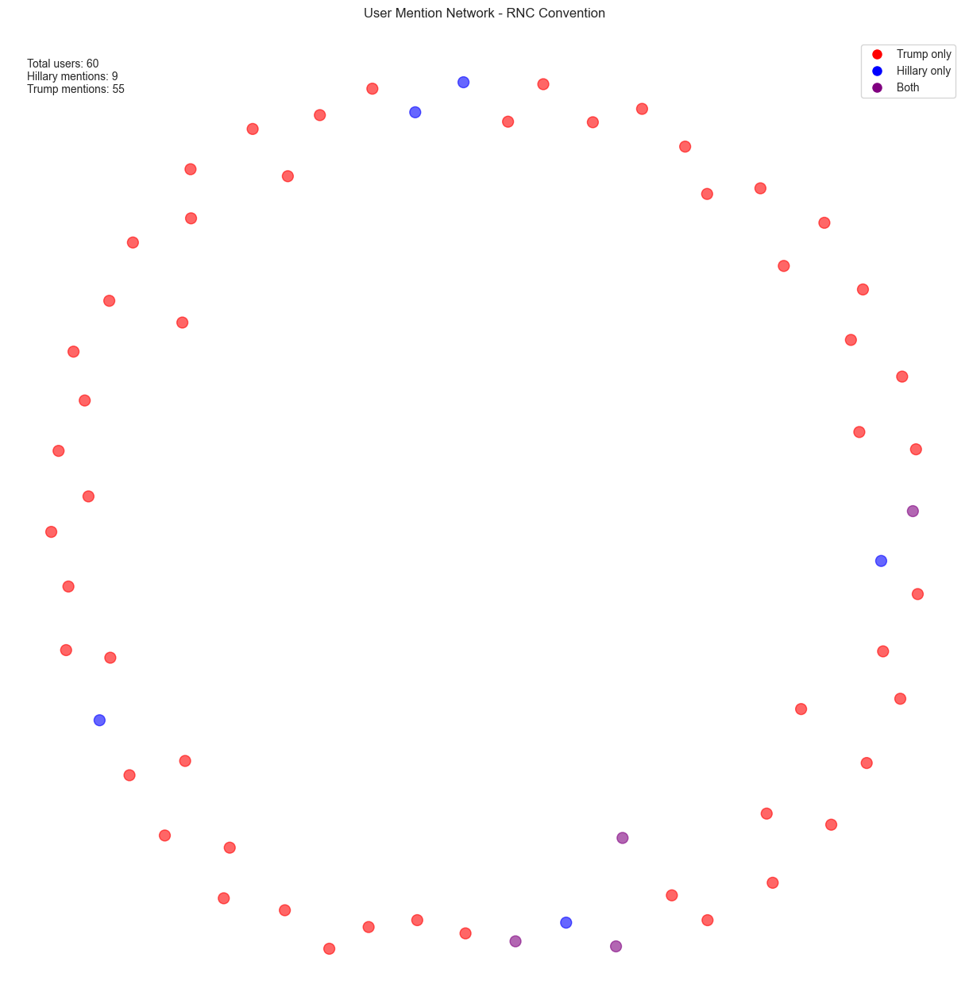


Network Statistics for RNC Convention:
Number of users: 60
Average degree: 0.00


/var/folders/9x/h2cdc6094jzcrs4ch0f4r84c0000gn/T/ipykernel_5811/1117616168.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


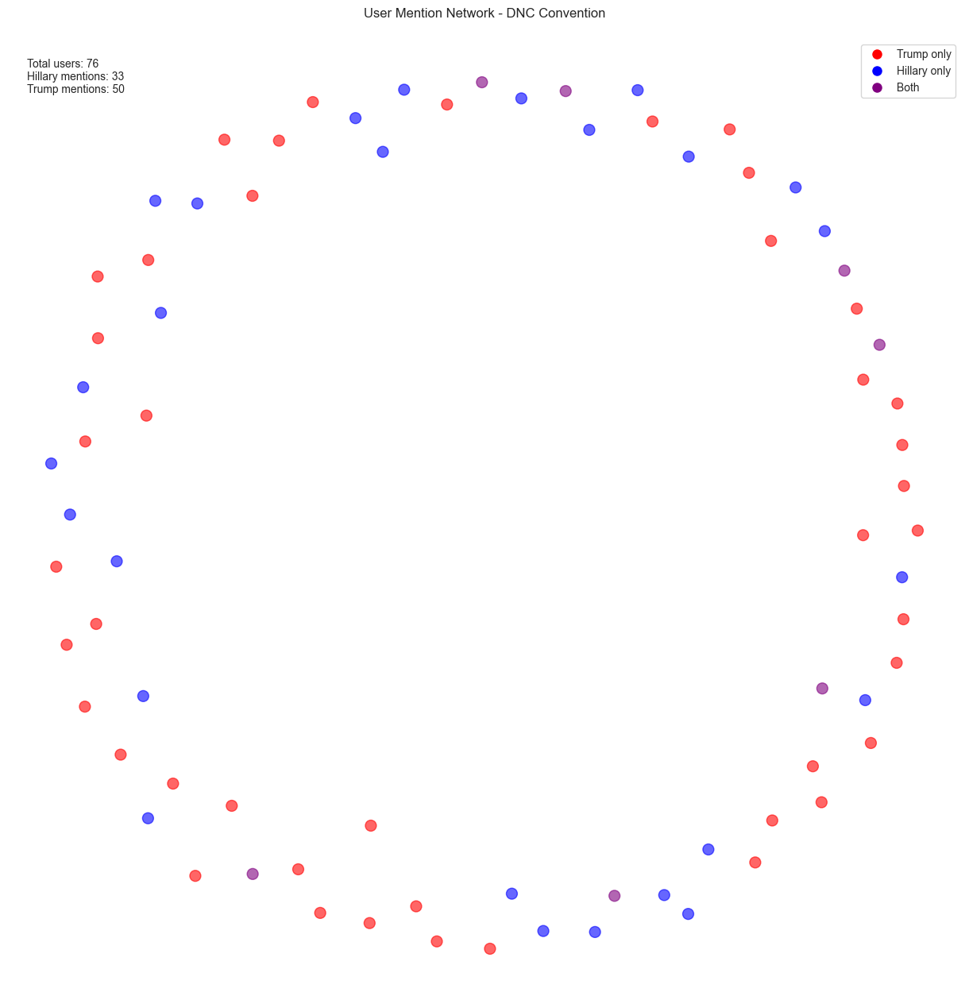


Network Statistics for DNC Convention:
Number of users: 76
Average degree: 0.00


/var/folders/9x/h2cdc6094jzcrs4ch0f4r84c0000gn/T/ipykernel_5811/1117616168.py:85: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


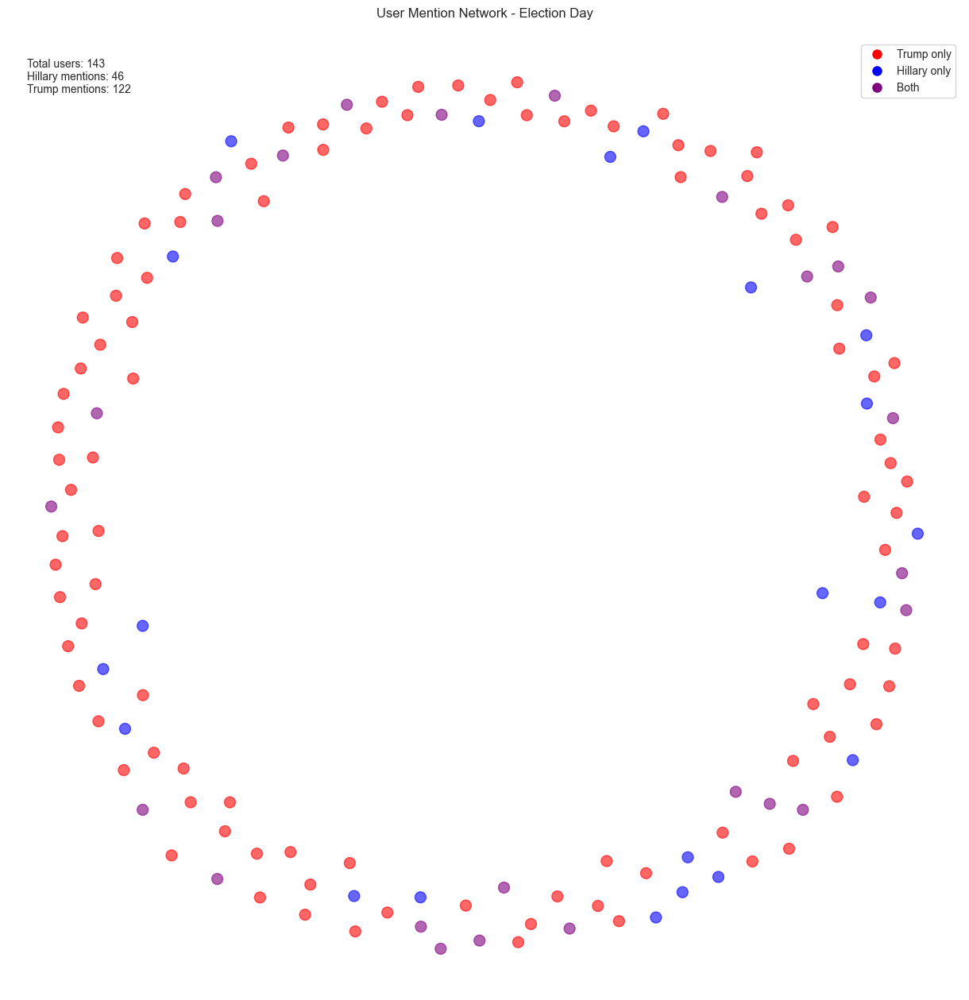


Network Statistics for Election Day:
Number of users: 143
Average degree: 0.00


In [47]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# Key dates to analyze
key_dates = ['2016-07-21', '2016-07-28', '2016-11-08']

# Convert dates to datetime and create date ranges (day before and after each date)
date_ranges = []
for date in key_dates:
    base_date = pd.to_datetime(date)
    date_ranges.append((
        base_date - timedelta(days=1),
        base_date + timedelta(days=1)
    ))

# Filter tweets within these date ranges
tweets_in_dates = []
for start_date, end_date in date_ranges:
    mask = (tweets_df['created_at'] >= start_date) & (tweets_df['created_at'] <= end_date)
    tweets_in_dates.append(tweets_df[mask])

# Create separate graphs for each date range
for i, (tweets, date) in enumerate(zip(tweets_in_dates, key_dates)):
    # Create a new graph
    G = nx.Graph()
    
    # Filter tweets mentioning candidates
    hillary_mask = tweets['text'].str.contains('hillary|hillaryclinton', case=False, na=False)
    trump_mask = tweets['text'].str.contains('trump|realdonaldtrump', case=False, na=False)
    
    # Add nodes (users) with their candidate mention as attribute
    for idx, row in tweets[hillary_mask | trump_mask].iterrows():
        G.add_node(row['user_key'], 
                  mentioned_hillary=bool(hillary_mask[idx]),
                  mentioned_trump=bool(trump_mask[idx]))
    
    # Create the plot
    plt.figure(figsize=(12, 12))
    
    # Use different colors for different types of users
    colors = []
    for node in G.nodes():
        if G.nodes[node]['mentioned_hillary'] and G.nodes[node]['mentioned_trump']:
            colors.append('purple')  # Mentioned both
        elif G.nodes[node]['mentioned_hillary']:
            colors.append('blue')    # Mentioned only Hillary
        else:
            colors.append('red')     # Mentioned only Trump
    
    # Draw the network
    pos = nx.spring_layout(G, k=1/np.sqrt(len(G.nodes())), iterations=50)
    nx.draw(G, pos,
           node_color=colors,
           node_size=100,
           alpha=0.6,
           with_labels=False)
    
    # Add title and legend
    event_names = {
        '2016-07-21': 'RNC Convention',
        '2016-07-28': 'DNC Convention',
        '2016-11-08': 'Election Day'
    }
    plt.title(f"User Mention Network - {event_names[date]}", pad=20)
    
    # Create legend
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', 
                                markerfacecolor=c, label=l, markersize=10)
                      for c, l in [('red', 'Trump only'), 
                                 ('blue', 'Hillary only'),
                                 ('purple', 'Both')]]
    plt.legend(handles=legend_elements, loc='upper right')
    
    # Add statistics
    stats_text = f"Total users: {len(G.nodes())}\n"
    stats_text += f"Hillary mentions: {sum(nx.get_node_attributes(G, 'mentioned_hillary').values())}\n"
    stats_text += f"Trump mentions: {sum(nx.get_node_attributes(G, 'mentioned_trump').values())}"
    plt.text(0.02, 0.98, stats_text, 
             transform=plt.gca().transAxes,
             verticalalignment='top',
             bbox=dict(facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # Print some network statistics
    print(f"\nNetwork Statistics for {event_names[date]}:")
    print(f"Number of users: {len(G.nodes())}")
    print(f"Average degree: {sum(dict(G.degree()).values())/len(G.nodes()):.2f}")

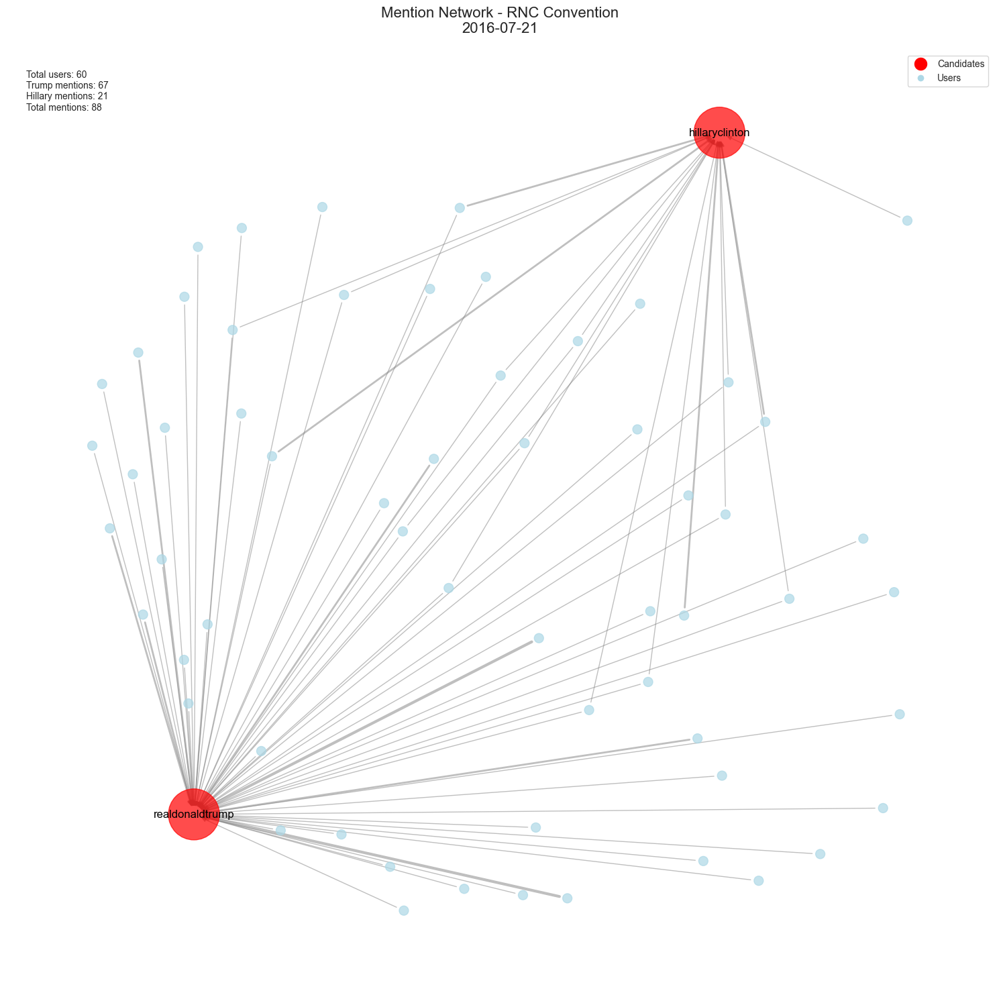


Network Statistics for RNC Convention (2016-07-21):
Number of users: 60
Trump mentions: 67
Hillary mentions: 21
Ratio (Trump/Hillary): 3.19
--------------------------------------------------


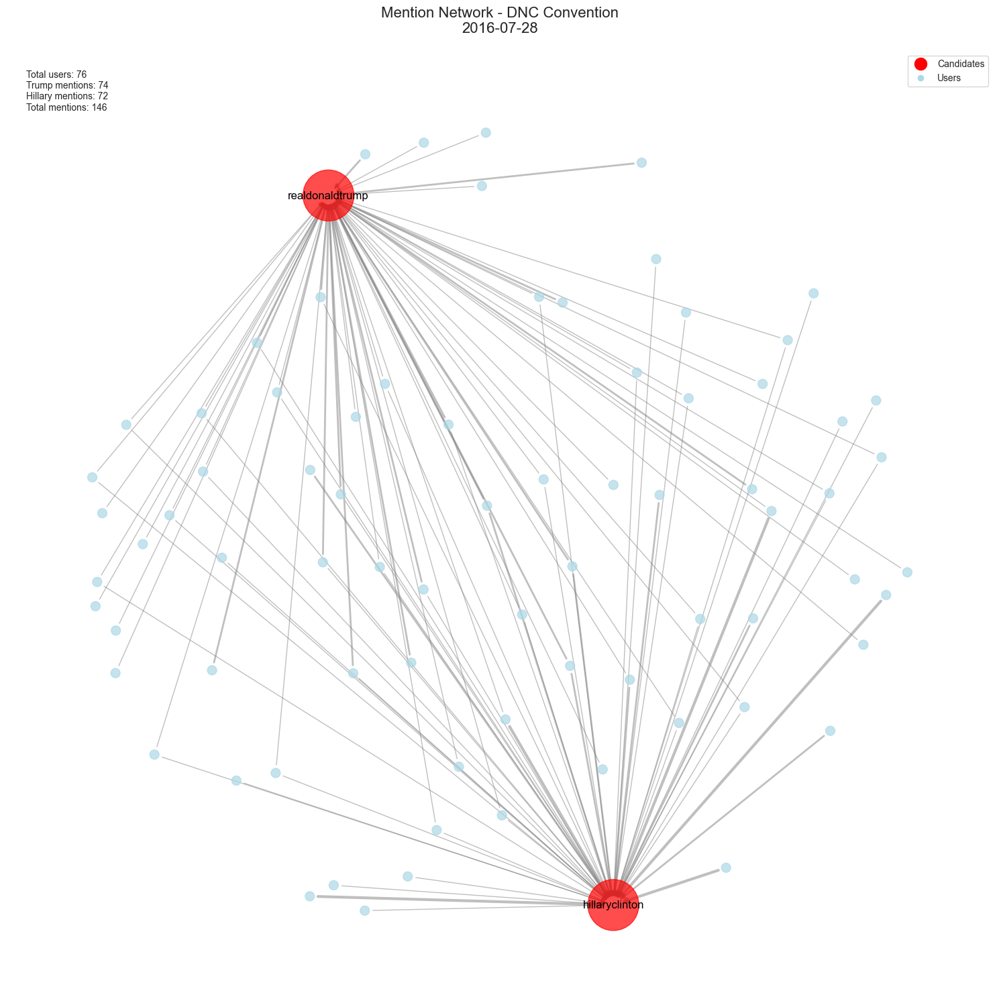


Network Statistics for DNC Convention (2016-07-28):
Number of users: 76
Trump mentions: 74
Hillary mentions: 72
Ratio (Trump/Hillary): 1.03
--------------------------------------------------


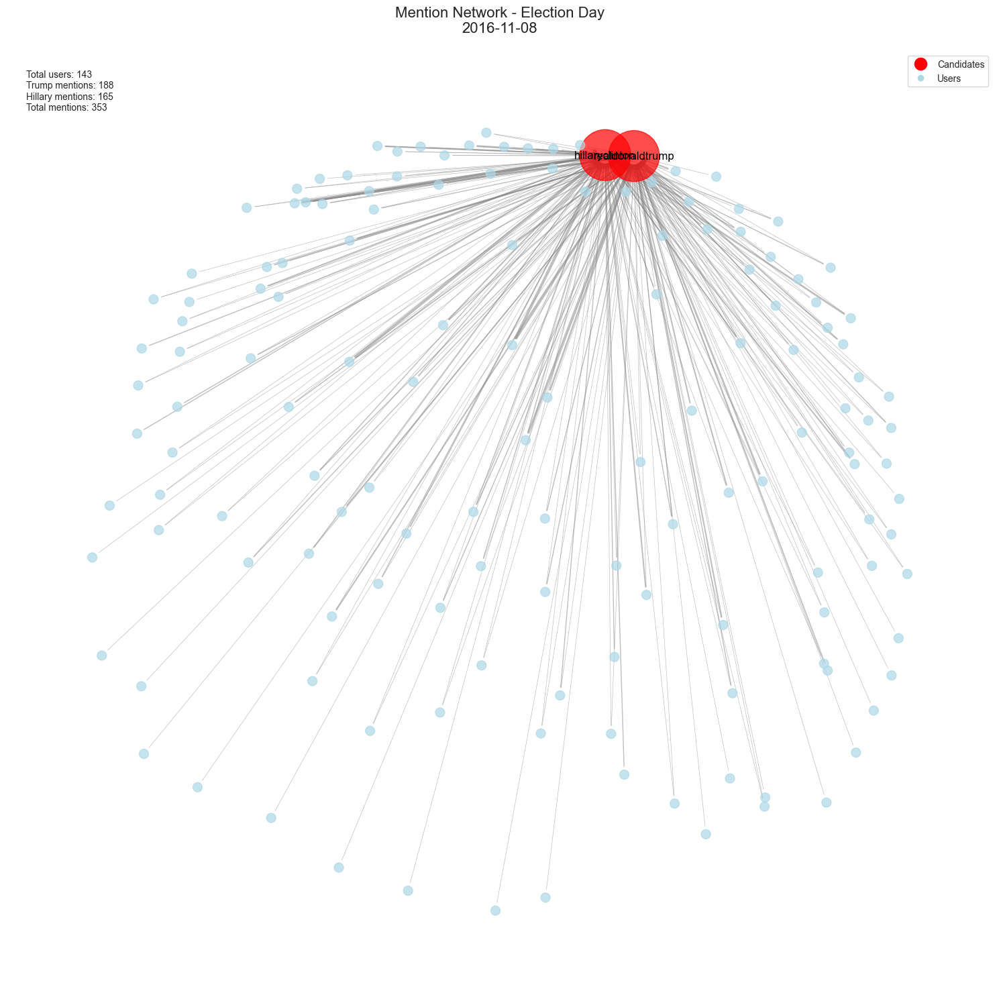


Network Statistics for Election Day (2016-11-08):
Number of users: 143
Trump mentions: 188
Hillary mentions: 165
Ratio (Trump/Hillary): 1.14
--------------------------------------------------


In [48]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# Define the key dates and their labels
key_dates = {
    '2016-07-21': 'RNC Convention',
    '2016-07-28': 'DNC Convention', 
    '2016-11-08': 'Election Day'
}

# Function to create graph for a specific date
def create_mention_graph(tweets_df, target_date):
    # Filter tweets within ±1 day of the target date
    date = pd.to_datetime(target_date)
    mask = (tweets_df['created_at'] >= date - timedelta(days=1)) & \
           (tweets_df['created_at'] <= date + timedelta(days=1))
    date_tweets = tweets_df[mask]
    
    # Create directed graph
    G = nx.DiGraph()
    G.add_node('realdonaldtrump', node_type='candidate')
    G.add_node('hillaryclinton', node_type='candidate')
    
    # Count mentions for each user
    for _, row in date_tweets.iterrows():
        if pd.isna(row['text']):
            continue
            
        text = row['text'].lower()
        trump_count = text.count('realdonaldtrump') + text.count('trump')
        hillary_count = text.count('hillaryclinton') + text.count('hillary')
        
        if trump_count > 0:
            G.add_edge(row['user_key'], 'realdonaldtrump', weight=trump_count)
        if hillary_count > 0:
            G.add_edge(row['user_key'], 'hillaryclinton', weight=hillary_count)
    
    return G

# Create and plot graphs for each date
for date, event in key_dates.items():
    G = create_mention_graph(tweets_df, date)
    
    plt.figure(figsize=(15, 15))
    
    # Position nodes
    pos = nx.spring_layout(G, k=1)
    
    # Draw edges with weights
    edges = G.edges(data=True)
    weights = [d['weight'] for (u, v, d) in edges]
    max_weight = max(weights) if weights else 1
    normalized_weights = [3 * w/max_weight for w in weights]
    
    nx.draw_networkx_edges(G, pos, width=normalized_weights, 
                          edge_color='gray', alpha=0.5)
    
    # Draw nodes with different colors and sizes for candidates vs users
    node_colors = ['red' if node in ['realdonaldtrump', 'hillaryclinton'] 
                   else 'lightblue' for node in G.nodes()]
    node_sizes = [3000 if node in ['realdonaldtrump', 'hillaryclinton'] 
                  else 100 for node in G.nodes()]
    
    nx.draw_networkx_nodes(G, pos, 
                          node_color=node_colors,
                          node_size=node_sizes,
                          alpha=0.7)
    
    # Add labels for candidates
    labels = {node: node for node in G.nodes() 
              if node in ['realdonaldtrump', 'hillaryclinton']}
    nx.draw_networkx_labels(G, pos, labels, font_size=12)
    
    plt.title(f"Mention Network - {event}\n{date}", pad=20, size=16)
    
    # Add legend
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', 
                  markerfacecolor='red', label='Candidates', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', 
                  markerfacecolor='lightblue', label='Users', markersize=8)
    ]
    plt.legend(handles=legend_elements, loc='upper right')
    
    # Remove axes
    plt.axis('off')
    
    # Add statistics
    trump_mentions = sum(d['weight'] for (u,v,d) in G.edges(data=True) 
                        if v=='realdonaldtrump')
    hillary_mentions = sum(d['weight'] for (u,v,d) in G.edges(data=True) 
                          if v=='hillaryclinton')
    
    stats = f"Total users: {len(G.nodes())-2}\n"  # -2 for candidates
    stats += f"Trump mentions: {trump_mentions}\n"
    stats += f"Hillary mentions: {hillary_mentions}\n"
    stats += f"Total mentions: {trump_mentions + hillary_mentions}"
    
    plt.text(0.02, 0.98, stats, 
             transform=plt.gca().transAxes,
             verticalalignment='top',
             bbox=dict(facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # Print network statistics
    print(f"\nNetwork Statistics for {event} ({date}):")
    print(f"Number of users: {len(G.nodes())-2}")
    print(f"Trump mentions: {trump_mentions}")
    print(f"Hillary mentions: {hillary_mentions}")
    print(f"Ratio (Trump/Hillary): {trump_mentions/hillary_mentions if hillary_mentions else 'inf':.2f}")
    print("-" * 50)

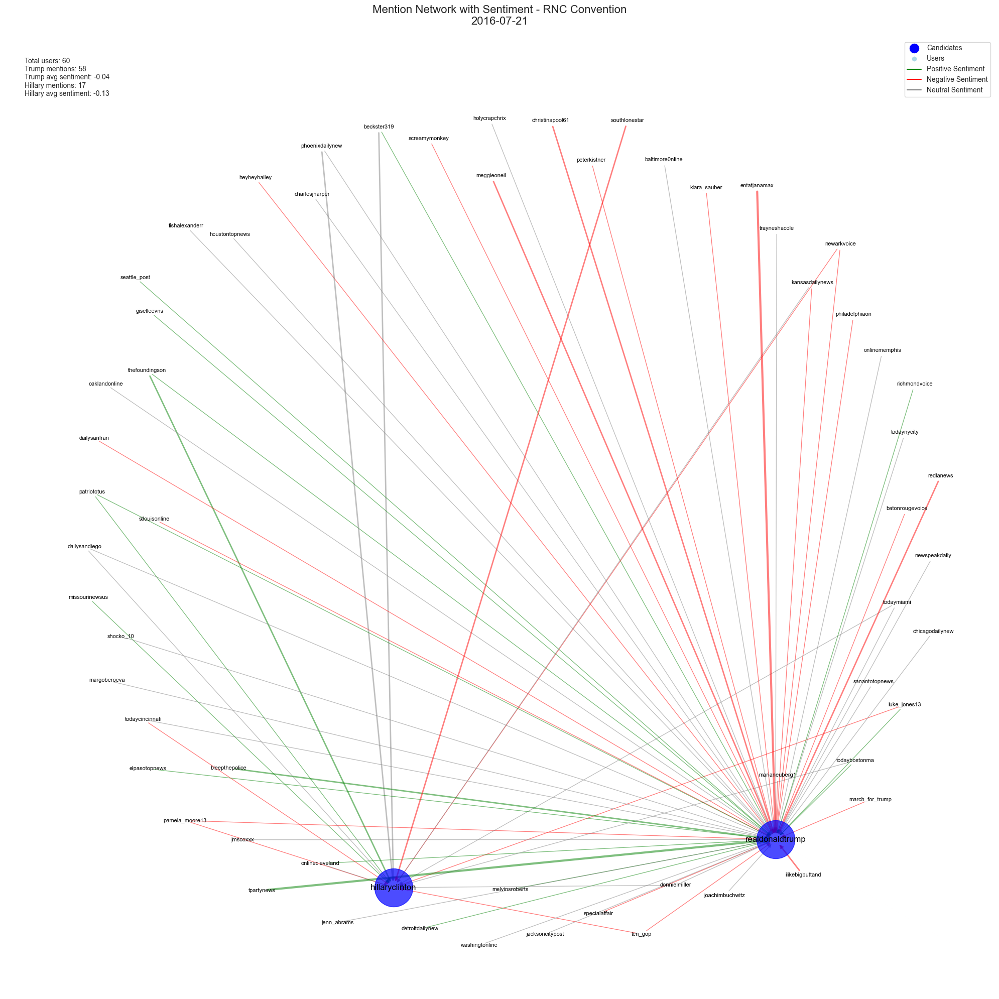


Detailed Statistics for RNC Convention (2016-07-21):
Number of users: 60
Average sentiment towards Trump: -0.045
Average sentiment towards Hillary: -0.133
--------------------------------------------------


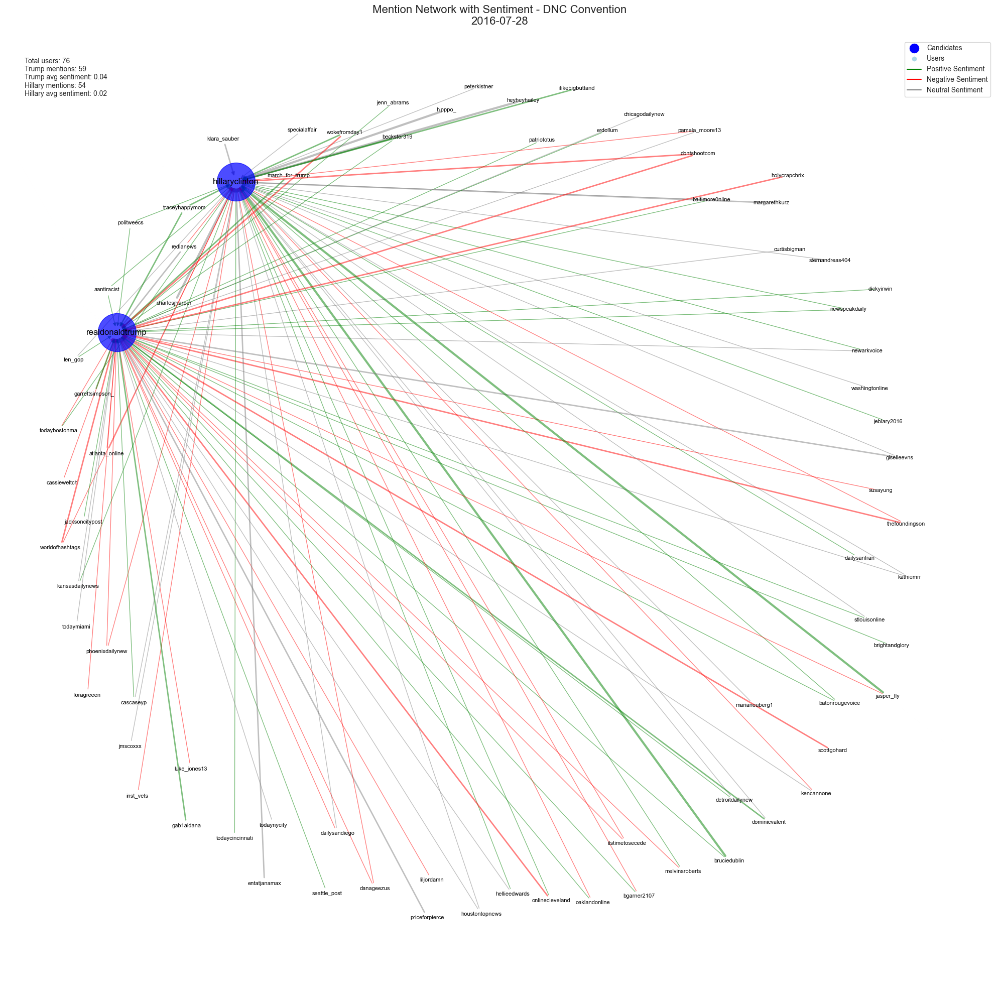


Detailed Statistics for DNC Convention (2016-07-28):
Number of users: 76
Average sentiment towards Trump: 0.035
Average sentiment towards Hillary: 0.020
--------------------------------------------------


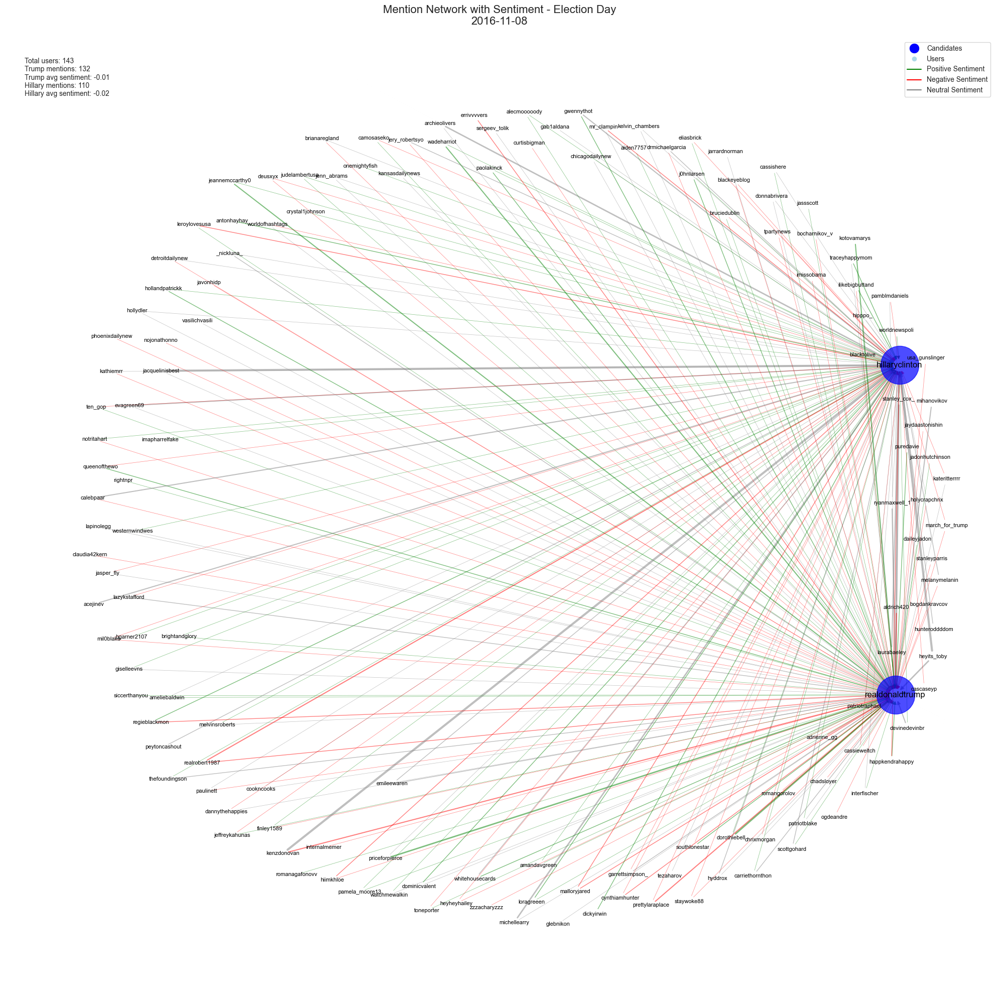


Detailed Statistics for Election Day (2016-11-08):
Number of users: 143
Average sentiment towards Trump: -0.013
Average sentiment towards Hillary: -0.015
--------------------------------------------------


In [51]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Initialize VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Define the key dates and their labels
key_dates = {
    '2016-07-21': 'RNC Convention',
    '2016-07-28': 'DNC Convention', 
    '2016-11-08': 'Election Day'
}

def get_sentiment_color(sentiment_scores):
    """Return color based on compound sentiment score"""
    if sentiment_scores['compound'] >= 0.05:
        return 'green'  # positive
    elif sentiment_scores['compound'] <= -0.05:
        return 'red'    # negative
    else:
        return 'gray'   # neutral

def create_mention_graph(tweets_df, target_date):
    # Filter tweets within ±1 day of the target date
    date = pd.to_datetime(target_date)
    mask = (tweets_df['created_at'] >= date - timedelta(days=1)) & \
           (tweets_df['created_at'] <= date + timedelta(days=1))
    date_tweets = tweets_df[mask]
    
    # Create directed graph
    G = nx.DiGraph()
    G.add_node('realdonaldtrump', node_type='candidate')
    G.add_node('hillaryclinton', node_type='candidate')
    
    # Dictionary to store user sentiments
    user_sentiments = {'trump': {}, 'hillary': {}}
    
    for _, row in date_tweets.iterrows():
        if pd.isna(row['text']):
            continue
            
        text = row['text'].lower()
        trump_count = text.count('realdonaldtrump') + text.count('trump')
        hillary_count = text.count('hillaryclinton') + text.count('hillary')
        
        # Calculate sentiment
        sentiment = analyzer.polarity_scores(row['text'])
        
        if trump_count > 0:
            G.add_edge(row['user_key'], 'realdonaldtrump', 
                      weight=trump_count,
                      sentiment=sentiment['compound'])
            if row['user_key'] not in user_sentiments['trump']:
                user_sentiments['trump'][row['user_key']] = []
            user_sentiments['trump'][row['user_key']].append(sentiment['compound'])
            
        if hillary_count > 0:
            G.add_edge(row['user_key'], 'hillaryclinton', 
                      weight=hillary_count,
                      sentiment=sentiment['compound'])
            if row['user_key'] not in user_sentiments['hillary']:
                user_sentiments['hillary'][row['user_key']] = []
            user_sentiments['hillary'][row['user_key']].append(sentiment['compound'])
    
    # Calculate average sentiment for each user
    for candidate in user_sentiments:
        for user in user_sentiments[candidate]:
            avg_sentiment = sum(user_sentiments[candidate][user]) / len(user_sentiments[candidate][user])
            G.nodes[user]['avg_sentiment_' + candidate] = avg_sentiment
    
    # Calculate node sizes based on mentions
    node_sizes = {}
    for user in G.nodes():
        if user in ['realdonaldtrump', 'hillaryclinton']:
            node_sizes[user] = 3000
        else:
            size = sum(d['weight'] for _, _, d in G.edges(data=True) if _ == user)
            node_sizes[user] = size * 100

    nx.set_node_attributes(G, node_sizes, 'size')
    return G

# Create and plot graphs for each date
for date, event in key_dates.items():
    G = create_mention_graph(tweets_df, date)
    
    plt.figure(figsize=(20, 20))
    
    # Increase k for more spacing between nodes
    pos = nx.spring_layout(G, k=3, iterations=50)
    
    # Draw edges with sentiment colors
    for (u, v, d) in G.edges(data=True):
        color = 'green' if d['sentiment'] > 0 else 'red' if d['sentiment'] < 0 else 'gray'
        edge_weight = d['weight']/max([d['weight'] for _, _, d in G.edges(data=True)])*3
        nx.draw_networkx_edges(G, pos, 
                             edgelist=[(u,v)], 
                             width=edge_weight,
                             edge_color=color,
                             alpha=0.5)
    
    # Draw candidate nodes
    nx.draw_networkx_nodes(G, pos, 
                          nodelist=['realdonaldtrump', 'hillaryclinton'],
                          node_color='blue',
                          node_size=3000,
                          alpha=0.7)
    
    # Draw user nodes
    user_nodes = [n for n in G.nodes() if n not in ['realdonaldtrump', 'hillaryclinton']]
    user_sizes = [G.nodes[n]['size'] for n in user_nodes]
    
    nx.draw_networkx_nodes(G, pos,
                          nodelist=user_nodes,
                          node_size=user_sizes,
                          node_color='lightblue',
                          alpha=0.6)
    
    # Draw labels for ALL nodes with different font sizes for candidates and users
    candidate_labels = {node: node for node in G.nodes() if node in ['realdonaldtrump', 'hillaryclinton']}
    user_labels = {node: node for node in G.nodes() if node not in ['realdonaldtrump', 'hillaryclinton']}
    
    nx.draw_networkx_labels(G, pos, candidate_labels, font_size=12)
    nx.draw_networkx_labels(G, pos, user_labels, font_size=8)
    
    plt.title(f"Mention Network with Sentiment - {event}\n{date}", pad=20, size=16)
    
    # Enhanced legend
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', 
                  label='Candidates', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightblue', 
                  label='Users', markersize=8),
        plt.Line2D([0], [0], color='green', label='Positive Sentiment'),
        plt.Line2D([0], [0], color='red', label='Negative Sentiment'),
        plt.Line2D([0], [0], color='gray', label='Neutral Sentiment')
    ]
    plt.legend(handles=legend_elements, loc='upper right')
    
    # Add statistics including sentiment
    trump_sentiment = [d['sentiment'] for (u,v,d) in G.edges(data=True) if v=='realdonaldtrump']
    hillary_sentiment = [d['sentiment'] for (u,v,d) in G.edges(data=True) if v=='hillaryclinton']
    
    stats = f"Total users: {len(G.nodes())-2}\n"
    stats += f"Trump mentions: {len(trump_sentiment)}\n"
    stats += f"Trump avg sentiment: {sum(trump_sentiment)/len(trump_sentiment) if trump_sentiment else 0:.2f}\n"
    stats += f"Hillary mentions: {len(hillary_sentiment)}\n"
    stats += f"Hillary avg sentiment: {sum(hillary_sentiment)/len(hillary_sentiment) if hillary_sentiment else 0:.2f}"
    
    plt.text(0.02, 0.98, stats, 
             transform=plt.gca().transAxes,
             verticalalignment='top',
             bbox=dict(facecolor='white', alpha=0.8))
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    # Print detailed statistics
    print(f"\nDetailed Statistics for {event} ({date}):")
    print(f"Number of users: {len(G.nodes())-2}")
    print(f"Average sentiment towards Trump: {sum(trump_sentiment)/len(trump_sentiment) if trump_sentiment else 0:.3f}")
    print(f"Average sentiment towards Hillary: {sum(hillary_sentiment)/len(hillary_sentiment) if hillary_sentiment else 0:.3f}")
    print("-" * 50)

In [52]:
import re

# Filter Russian users first
russian_pattern = re.compile(r'Russia|Россия|Москва|Moscow|Sankt|Санкт|Петербург|Petersburg', re.IGNORECASE)
russian_users = users_df[users_df['location'].fillna('').str.contains(russian_pattern, na=False)]
print(f"Found {len(russian_users)} users from Russia")

# Filter tweets to only those from Russian users
russian_tweets = tweets_df[tweets_df['user_key'].isin(russian_users['screen_name'])]
print(f"Found {len(russian_tweets)} tweets from Russian users")

Found 44 users from Russia
Found 45 tweets from Russian users


Found 44 users from Russia
Found 45 tweets from Russian users


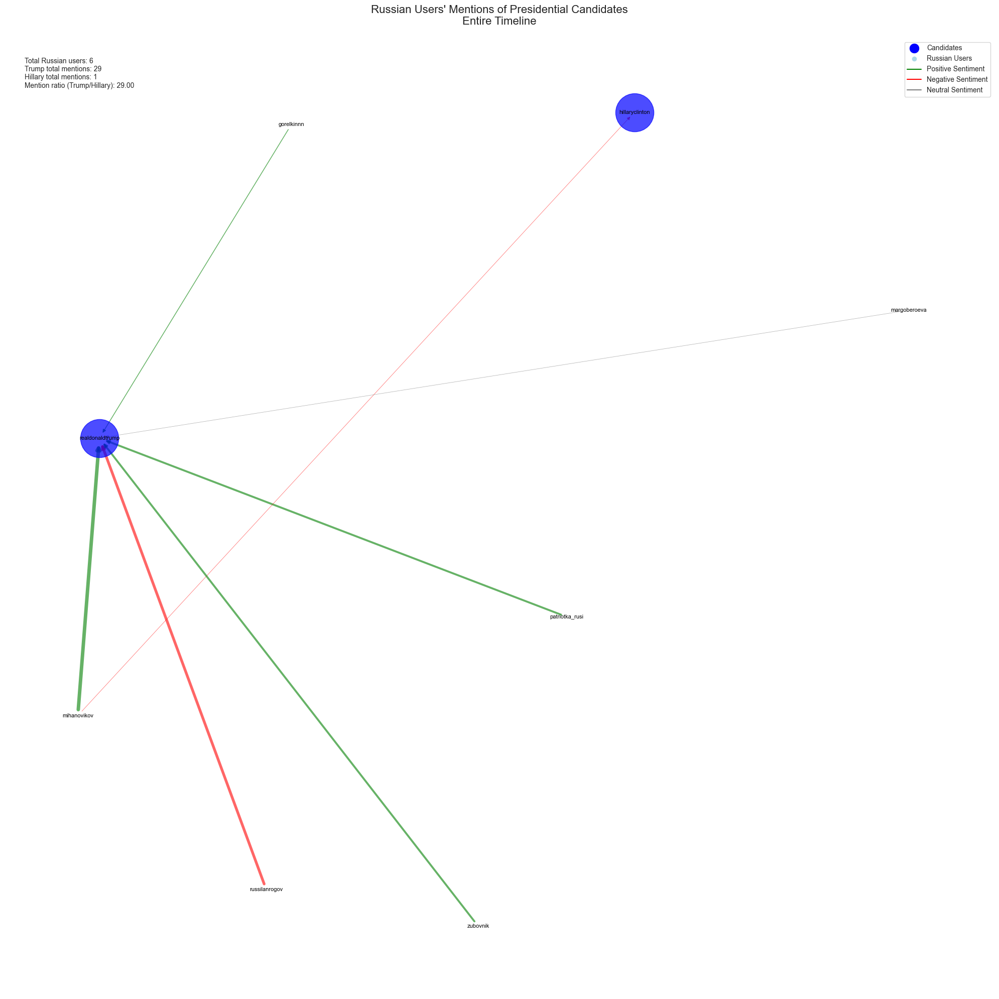


Detailed Statistics:
Number of Russian users: 6
Total mentions of Trump: 29
Total mentions of Hillary: 1
Average sentiment towards Trump: 0.087
Average sentiment towards Hillary: -0.477


In [53]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Filter Russian users
russian_pattern = re.compile(r'Russia|Россия|Москва|Moscow|Sankt|Санкт|Петербург|Petersburg', re.IGNORECASE)
russian_users = users_df[users_df['location'].fillna('').str.contains(russian_pattern, na=False)]
print(f"Found {len(russian_users)} users from Russia")

# Filter tweets to only those from Russian users
russian_tweets = tweets_df[tweets_df['user_key'].isin(russian_users['screen_name'])]
print(f"Found {len(russian_tweets)} tweets from Russian users")

# Initialize VADER
analyzer = SentimentIntensityAnalyzer()

# Create graph
G = nx.DiGraph()

# Add candidate nodes
G.add_node('realdonaldtrump', node_type='candidate')
G.add_node('hillaryclinton', node_type='candidate')

# Process all tweets
for _, row in russian_tweets.iterrows():
    if pd.isna(row['text']):
        continue
        
    text = row['text'].lower()
    trump_count = text.count('realdonaldtrump') + text.count('trump')
    hillary_count = text.count('hillaryclinton') + text.count('hillary')
    
    # Calculate sentiment
    sentiment = analyzer.polarity_scores(row['text'])
    
    # Add edges for mentions
    if trump_count > 0:
        if G.has_edge(row['user_key'], 'realdonaldtrump'):
            # Update existing edge
            G[row['user_key']]['realdonaldtrump']['weight'] += trump_count
            G[row['user_key']]['realdonaldtrump']['sentiments'].append(sentiment['compound'])
        else:
            # Create new edge
            G.add_edge(row['user_key'], 'realdonaldtrump', 
                      weight=trump_count,
                      sentiments=[sentiment['compound']])
            
    if hillary_count > 0:
        if G.has_edge(row['user_key'], 'hillaryclinton'):
            # Update existing edge
            G[row['user_key']]['hillaryclinton']['weight'] += hillary_count
            G[row['user_key']]['hillaryclinton']['sentiments'].append(sentiment['compound'])
        else:
            # Create new edge
            G.add_edge(row['user_key'], 'hillaryclinton', 
                      weight=hillary_count,
                      sentiments=[sentiment['compound']])

# Calculate average sentiments for edges
for u, v, d in G.edges(data=True):
    d['avg_sentiment'] = sum(d['sentiments']) / len(d['sentiments'])

# Create the visualization
plt.figure(figsize=(20, 20))

# Position nodes with more space
pos = nx.spring_layout(G, k=2, iterations=50)

# Draw edges with colors based on sentiment and width based on mention count
max_weight = max([d['weight'] for _, _, d in G.edges(data=True)])

for (u, v, d) in G.edges(data=True):
    color = 'green' if d['avg_sentiment'] > 0 else 'red' if d['avg_sentiment'] < 0 else 'gray'
    width = (d['weight'] / max_weight) * 5  # Scale edge width
    nx.draw_networkx_edges(G, pos, 
                          edgelist=[(u,v)], 
                          width=width,
                          edge_color=color,
                          alpha=0.6)

# Draw nodes
nx.draw_networkx_nodes(G, pos, 
                      nodelist=['realdonaldtrump', 'hillaryclinton'],
                      node_color='blue',
                      node_size=3000,
                      alpha=0.7)

user_nodes = [n for n in G.nodes() if n not in ['realdonaldtrump', 'hillaryclinton']]
user_sizes = [sum([d['weight'] for _, _, d in G.edges(data=True) if u == _]) * 100 for u in user_nodes]

nx.draw_networkx_nodes(G, pos,
                      nodelist=user_nodes,
                      node_size=user_sizes,
                      node_color='lightblue',
                      alpha=0.6)

# Draw all labels
labels = {node: node for node in G.nodes()}
nx.draw_networkx_labels(G, pos, labels, font_size=8)

plt.title("Russian Users' Mentions of Presidential Candidates\nEntire Timeline", pad=20, size=16)

# Add legend
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', 
              label='Candidates', markersize=15),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightblue', 
              label='Russian Users', markersize=8),
    plt.Line2D([0], [0], color='green', label='Positive Sentiment'),
    plt.Line2D([0], [0], color='red', label='Negative Sentiment'),
    plt.Line2D([0], [0], color='gray', label='Neutral Sentiment')
]
plt.legend(handles=legend_elements, loc='upper right')

# Add statistics
stats = f"Total Russian users: {len(user_nodes)}\n"
trump_mentions = sum(d['weight'] for _, v, d in G.edges(data=True) if v == 'realdonaldtrump')
hillary_mentions = sum(d['weight'] for _, v, d in G.edges(data=True) if v == 'hillaryclinton')
stats += f"Trump total mentions: {trump_mentions}\n"
stats += f"Hillary total mentions: {hillary_mentions}\n"
stats += f"Mention ratio (Trump/Hillary): {trump_mentions/hillary_mentions if hillary_mentions else 'inf':.2f}"

plt.text(0.02, 0.98, stats, 
         transform=plt.gca().transAxes,
         verticalalignment='top',
         bbox=dict(facecolor='white', alpha=0.8))

plt.axis('off')
plt.tight_layout()
plt.show()

# Print detailed statistics
print("\nDetailed Statistics:")
print(f"Number of Russian users: {len(user_nodes)}")
print(f"Total mentions of Trump: {trump_mentions}")
print(f"Total mentions of Hillary: {hillary_mentions}")
print(f"Average sentiment towards Trump: {sum(d['avg_sentiment']*d['weight'] for _,v,d in G.edges(data=True) if v=='realdonaldtrump')/trump_mentions:.3f}")
print(f"Average sentiment towards Hillary: {sum(d['avg_sentiment']*d['weight'] for _,v,d in G.edges(data=True) if v=='hillaryclinton')/hillary_mentions:.3f}")

/var/folders/9x/h2cdc6094jzcrs4ch0f4r84c0000gn/T/ipykernel_5811/2176064686.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  russian_tweets['created_at'] = pd.to_datetime(russian_tweets['created_str'])


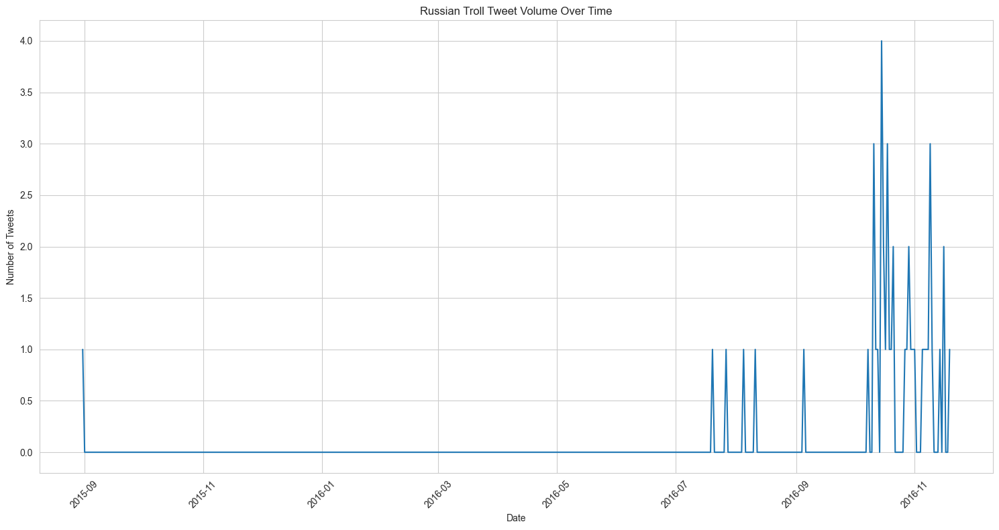

In [54]:
# Analyze posting patterns over time for Russian trolls
plt.figure(figsize=(15, 8))
russian_tweets['created_at'] = pd.to_datetime(russian_tweets['created_str'])
daily_russian_tweets = russian_tweets.set_index('created_at').resample('D')['tweet_id'].count()
plt.plot(daily_russian_tweets.index, daily_russian_tweets.values)
plt.title('Russian Troll Tweet Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Tweets')
plt.xticks(rotation=45)
plt.tight_layout()


Hashtag Usage Statistics:
Total unique hashtags: 19
Total hashtag uses: 32

Top hashtags and their frequencies:
Trump: 6
Clinton: 4
Iceland: 2
Obama: 2
PirateParty: 2
YEMEN: 2
wikileaks: 2
Assange: 1
Podesta31: 1
ImWithHumusMarshmallowsPeanutButterSteakRibeye: 1
ElectionNight: 1
DonaldTrump: 1
Wisconsin: 1
ImwithChickenAvocadoSubwayDressedwithSweetOnionAndDoubleHoneyMustard: 1
DAPL: 1
Drug: 1
WADA: 1
Podesta10: 1
Putin: 1


/var/folders/9x/h2cdc6094jzcrs4ch0f4r84c0000gn/T/ipykernel_5811/2370372018.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  stats_text += f'Most Used: {russian_hashtag_freq.index[0]} ({russian_hashtag_freq[0]} times)'


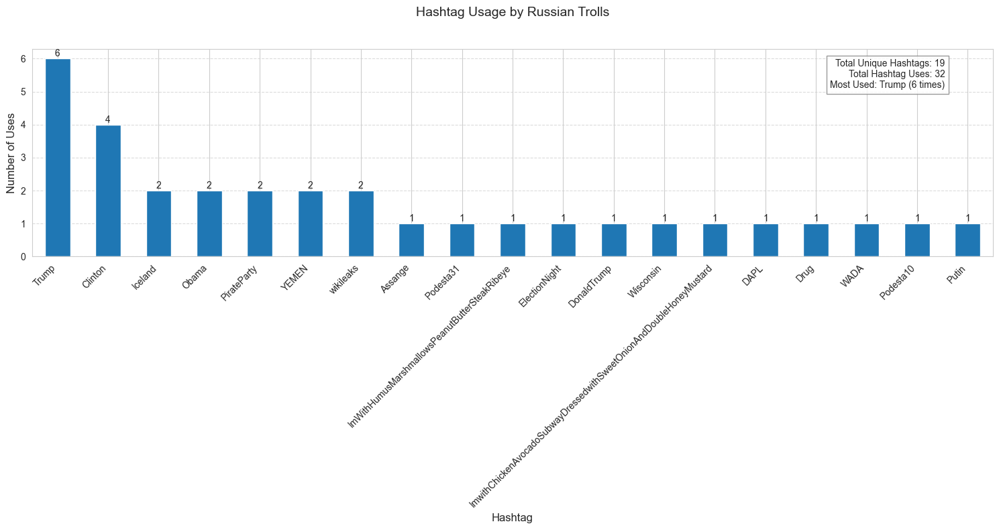

In [57]:
# Process hashtags as before since that worked
russian_hashtags = []
for tags in russian_tweets['hashtags'].dropna():
    if isinstance(tags, list) and tags:  # Only process non-empty lists
        russian_hashtags.extend(tags)

russian_hashtag_freq = pd.Series(russian_hashtags).value_counts()

# Create a more informative visualization
plt.figure(figsize=(15, 8))
ax = russian_hashtag_freq.plot(kind='bar')

# Add title and labels
plt.title('Hashtag Usage by Russian Trolls\n', fontsize=14, pad=20)
plt.xlabel('Hashtag', fontsize=12)
plt.ylabel('Number of Uses', fontsize=12)

# Add value labels on top of each bar
for i, v in enumerate(russian_hashtag_freq):
    ax.text(i, v, str(v), ha='center', va='bottom')

# Improve readability
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add summary statistics
stats_text = f'Total Unique Hashtags: {len(russian_hashtag_freq)}\n'
stats_text += f'Total Hashtag Uses: {sum(russian_hashtag_freq)}\n'
stats_text += f'Most Used: {russian_hashtag_freq.index[0]} ({russian_hashtag_freq[0]} times)'

plt.text(0.95, 0.95, stats_text,
         transform=ax.transAxes,
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'),
         ha='right', va='top')

plt.tight_layout()

# Print detailed statistics
print("\nHashtag Usage Statistics:")
print(f"Total unique hashtags: {len(russian_hashtag_freq)}")
print(f"Total hashtag uses: {sum(russian_hashtag_freq)}")
print("\nTop hashtags and their frequencies:")
for hashtag, count in russian_hashtag_freq.items():
    print(f"{hashtag}: {count}")


Most active Russian troll accounts:
user_key
mihanovikov       16
russilanrogov     12
patriotka_rusi     5
coldwar20_ru       4
margoberoeva       2
Name: count, dtype: int64


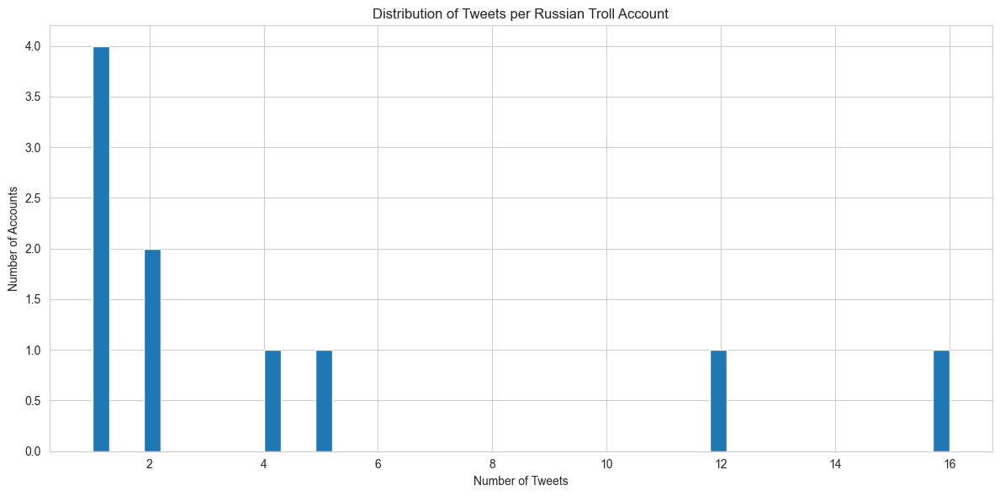

In [58]:
# Analyze Russian troll posting patterns
russian_user_tweet_counts = russian_tweets['user_key'].value_counts()
print("\nMost active Russian troll accounts:")
print(russian_user_tweet_counts.head())

# Plot distribution of tweets per Russian account
plt.figure(figsize=(12, 6))
plt.hist(russian_user_tweet_counts.values, bins=50)
plt.title('Distribution of Tweets per Russian Troll Account')
plt.xlabel('Number of Tweets')
plt.ylabel('Number of Accounts')
plt.tight_layout()

In [59]:
# Analyze retweet patterns of Russian trolls
russian_retweet_ratio = len(russian_tweets[russian_tweets['retweeted'].notna()]) / len(russian_tweets)
print(f"\nRetweet ratio for Russian trolls: {russian_retweet_ratio:.2%}")

# Look at most retweeted content from Russian trolls
russian_most_retweeted = russian_tweets.nlargest(10, 'retweet_count')
print("\nMost retweeted content from Russian trolls:")
for _, tweet in russian_most_retweeted.iterrows():
    print(f"Retweets: {tweet['retweet_count']}")
    print(f"Text: {tweet['text']}\n")


Retweet ratio for Russian trolls: 100.00%

Most retweeted content from Russian trolls:
Retweets: 137.0
Text: ТЕЛЕКАНАЛ CNN ВЫРУБИЛ ИЗ ЭФИРА КОНГРЕССМЕНА, УПОМЯНУВШЕГО ИНФОРМАЦИЮ WIKILEAKS О ХИЛЛАРИ КЛИНТОН. СВОБОДА СЛОВА В Д… https://t.co/fxteiH0MXT

Retweets: 87.0
Text: ОДНА ИЗ САМЫХ ОБСУЖДАЕМЫХ ТЕМ НА САММИТЕ G20 - КАК ВСЕ ИЗМЕНИЛОСЬ ЗА ГОД https://t.co/qv4IDQnYtc

Retweets: 47.0
Text: ЕСЛИ ПАРИЖ ЗАСЛУЖИВАЕТ МИНУТУ МОЛЧАНИЯ, ТО ДОНБАСС И СИРИЯ ЗАСЛУЖИВАЮТ, ЧТОБЫ ВСЕ СТРАНЫ В МИРЕ ЗАМОЛЧАЛИ НАВСЕГДА https://t.co/CD51GI1kvC

Retweets: 18.0
Text: @realDonaldTrump http://t.co/dYtMxmRTlt

Retweets: 0.0
Text: RT @TrumpD2016: "@ABC .@realDonaldTrump tells @GMA "something happened" with FBI's decision not to charge Clinton "She's so guilty." https:…

Retweets: 0.0
Text: RT @zapvv: Твиттер играет на стороне Хиллари, обложив аккаунт @realDonaldTrump махровой цензурой. 
#Trump, айда в ВКонтакте!
 https://t.co/…

Retweets: 0.0
Text: RT @A_G_Dugin: Donald Trump Officially Earned the GOP Nominati


Accounts most mentioned by Russian trolls:
rt_com             13
rt_america          7
realdonaldtrump     7
a_g_dugin           2
usembhell           1
cernovich           1
sputnikint          1
borisjohnson        1
whitehousecards     1
republicbuzz        1
dmitriyveret        1
cnn                 1
robert_bridge       1
trumpd2016          1
presstv             1
romaacorn           1
moskru              1
huffpostpol         1
beyonce             1
vallisitsa          1
Name: count, dtype: int64


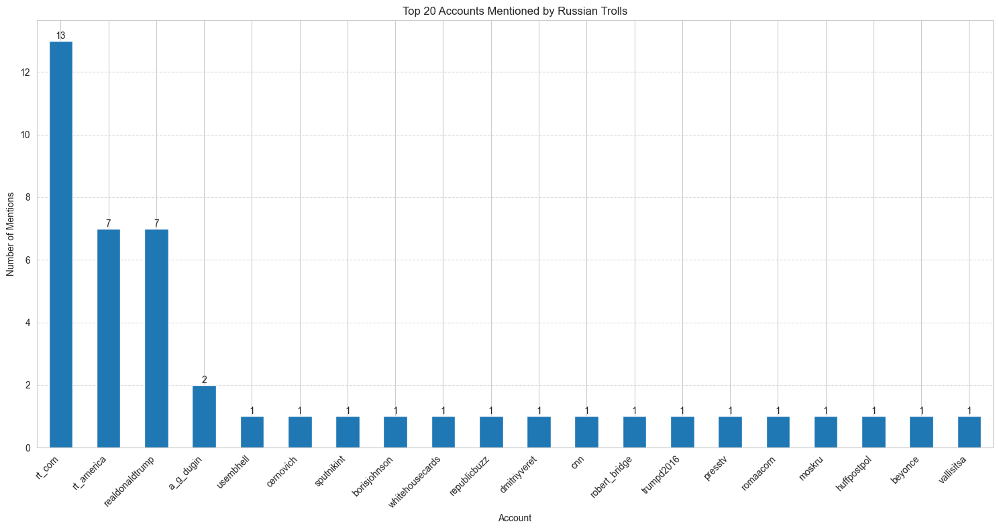

In [62]:
# Analyze mention patterns of Russian trolls
russian_mentions = []
for mentions in russian_tweets['mentions'].dropna():
    # If it's already a list, use it directly
    if isinstance(mentions, list):
        russian_mentions.extend(mentions)

russian_mention_freq = pd.Series(russian_mentions).value_counts()
print("\nAccounts most mentioned by Russian trolls:")
print(russian_mention_freq.head(20))

# Visualize top mentions
plt.figure(figsize=(15, 8))
russian_mention_freq.head(20).plot(kind='bar')
plt.title('Top 20 Accounts Mentioned by Russian Trolls')
plt.xlabel('Account')
plt.ylabel('Number of Mentions')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels on top of each bar
for i, v in enumerate(russian_mention_freq.head(20)):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.tight_layout()